
# Analysis Data PFT Scanner Pilots -- Extracting reports from online questionnaires

## Load data and relevant variables participants
 --------


In [14]:
data_exp1 = pd.read_csv('/Users/pradyumna/OneDrive - University College London/PhD Projects/PFT_MRI_Experiment/Scanner Pilot/All_Behavioral/PFT_Choice_Onsets_Partic_AllJoined.csv') 
data_exp_ratings_2 = pd.read_csv('/Users/pradyumna/OneDrive - University College London/PhD Projects/PFT_MRI_Experiment/Scanner Pilot/All_Behavioral/PFT_Rate_Onsets_Partic_AllJoined.csv') 

In [15]:
# Insert to exclude particitipants
excludedPart = []
for i in excludedPart:
    data_exp1 = data_exp1[(data_exp1.Part != i)]
    data_exp_ratings_2 = data_exp_ratings_2[(data_exp_ratings_2.Part != i)]
print (data_exp1["part"].unique())
print ('Number of participants: ' + str(len(data_exp1["part"].unique())))

[ 3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
Number of participants: 17


In [16]:
data_exp1.columns

Index(['trial', 'trialOnset', 'leftId', 'rightId', 'frame', 'trialOnsetTim',
       'trialSnd1Tim', 'trialSnd2Tim', 'trialThinkTime', 'trialRespTime',
       'trialEnd', 'choice', 'choiceTime', 'primerSound', 'part', 'session',
       'LRat1', 'RRat1', 'LRat2', 'RRat2', 'LVar1', 'RVar1', 'LVar2', 'RVar2',
       'LValOn', 'RValOn', 'LFamOn', 'RFamOn', 'TotVal1', 'TotVal2', 'DVal1',
       'absDVal1', 'DVar1', 'absDVar1', 'DVal2', 'absDVal2', 'DVar2',
       'absDVar2', 'ChosenVal1', 'UnchosenVal1', 'DChoUnchosen1', 'ChosenVal2',
       'UnchosenVal2', 'DChoUnchosen2', 'zLRat1', 'zRRat1', 'zLRat2', 'zRRat2',
       'zLValOn', 'zRValOn', 'zLFamOn', 'zRFamOn', 'zLVar1', 'zRVar1',
       'zLVar2', 'zRVar2', 'zDVal1', 'zabsDVal1', 'zDVal2', 'zabsDVal2',
       'zDVar1', 'zabsDVar1', 'zDVar2', 'zabsDVar2', 'zTotVal1', 'zTotVal2',
       'zChoiceTime', 'zChosenVal1', 'zUnchosenVal1', 'zChosenVal2',
       'zUnchosenVal2', 'zDChoUnchosen1', 'zDChoUnchosen2', 'ChosenValOn',
       'UnchosenValO

In [17]:
data_exp1

,trial,trialOnset,leftId,rightId,frame,trialOnsetTim,trialSnd1Tim,trialSnd2Tim,trialThinkTime,trialRespTime,...,DChoUnchosenOn,zChosenValOn,zUnchosenValOn,zDChoUnchosenOn,TotValOn,DValOn,absDValOn,zDValOn,zTotValOn,zAbsDValOn
0,0.0,97.154134,6.0,2.0,2.0,97.162739,98.174875,98.675894,100.661222,100.661725,...,2.0,0.456915,-1.318883,1.098170,4,2,2,1.095445,-0.774597,0.447214
1,1.0,107.304030,5.0,6.0,1.0,107.314542,108.334392,108.835600,110.819337,110.819687,...,-1.0,-1.357875,-0.441702,-0.543264,3,-1,1,-0.547723,-1.549193,-0.894427
2,2.0,118.904234,6.0,2.0,1.0,118.911135,119.928075,120.429292,122.413088,122.413422,...,2.0,0.456915,-1.318883,1.098170,4,2,2,1.095445,-0.774597,0.447214
3,3.0,131.955079,5.0,6.0,2.0,131.961902,132.989758,133.490987,135.456976,135.457324,...,1.0,-0.450480,-1.318883,0.551025,3,-1,1,-0.547723,-1.549193,-0.894427
4,4.0,162.405880,5.0,2.0,1.0,162.413470,163.444844,163.946065,165.916748,165.917095,...,1.0,0.456915,-0.441702,0.551025,5,1,1,0.547723,0.000000,-0.894427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2443,19.0,494.465870,6.0,5.0,1.0,494.473105,495.497880,495.998354,497.968757,497.968954,...,2.0,1.368852,-0.431192,1.087711,6,-2,2,-1.095445,0.774597,0.447214
2444,20.0,504.616747,6.0,2.0,2.0,504.623988,505.642842,506.143454,508.128420,508.128621,...,-3.0,-1.323005,1.332189,-1.611861,5,-3,3,-1.643168,0.000000,1.788854
2445,21.0,517.666808,2.0,1.0,1.0,517.674386,518.700931,519.201360,521.172320,521.172505,...,2.0,0.471566,-1.312882,1.087711,4,2,2,1.095445,-0.774597,0.447214
2446,22.0,536.518043,6.0,1.0,1.0,536.526908,537.553326,538.054032,540.022021,540.022277,...,1.0,1.368852,0.450499,0.547796,7,-1,1,-0.547723,1.549193,-0.894427


In [18]:
data_exp_ratings_2

,Unnamed: 0,trial,trialOnset,picId,picNum,frame,rating,trialImageOnst,trialRateOnst,trialRatEnd,...,ExVal,ValOnl,FamlOnl,zVal1,zVal2,zVar1,zVar2,zExVal,zValOnl,zFamlOnl
0,0,1.0,18.850946,2.0,19.0,2.0,-1.0,19.357367,-1.000000,-1.000000,...,55.0,3,74.0,0.173494,0.426401,-0.657193,-1.686787,1.111299,0.447214,0.732673
1,1,2.0,24.651001,5.0,23.0,2.0,-1.0,25.243570,-1.000000,-1.000000,...,26.0,2,10.0,-0.983135,0.426401,-0.408732,0.933146,-0.383318,-0.447214,-1.124399
2,2,3.0,33.351696,1.0,23.0,2.0,-1.0,33.911593,-1.000000,-1.000000,...,44.0,4,91.0,1.561450,-1.705606,1.723117,0.376821,0.544375,1.341641,1.225958
3,3,4.0,42.052167,2.0,22.0,2.0,-1.0,42.644173,-1.000000,-1.000000,...,33.0,3,74.0,0.173494,0.426401,-0.657193,-1.686787,-0.022548,0.447214,0.732673
4,4,5.0,49.301875,5.0,17.0,2.0,2.0,49.863565,54.904632,57.290269,...,46.0,2,10.0,-0.983135,0.426401,-0.408732,0.933146,0.647452,-0.447214,-1.124399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3259,27,28.0,437.914814,6.0,37.0,2.0,-1.0,438.474451,-1.000000,-1.000000,...,86.0,4,100.0,1.000000,-0.855186,NaN,-0.915987,1.039474,1.341641,1.221057
3260,28,29.0,453.864730,6.0,38.0,2.0,-1.0,454.425820,-1.000000,-1.000000,...,70.0,4,100.0,1.000000,-0.855186,NaN,-0.915987,0.229001,1.341641,1.221057
3261,29,30.0,461.114771,2.0,36.0,2.0,-1.0,461.676265,-1.000000,-1.000000,...,72.0,1,70.0,-1.000000,1.588203,NaN,-0.915987,0.330310,-1.341641,0.189178
3262,30,31.0,527.817550,6.0,36.0,1.0,-1.0,528.379411,-1.000000,-1.000000,...,75.0,4,100.0,1.000000,-0.855186,NaN,-0.915987,0.482274,1.341641,1.221057


In [35]:
data_exp1=data_exp1.rename(index=str, columns={"choiceTime":"RT",
                                              "part":"Part"})

data_exp_ratings_2 = data_exp_ratings_2.rename(index=str, columns={"choiceTime":"RT",
                                              "part":"Part"})

## drop NaNs from choice rows

In [36]:
#data_exp1 = data_exp1.dropna(axis = 0, how ='any') 
#data_exp_ratings_2 = data_exp_ratings_2.dropna(axis = 0, how ='any') 

In [37]:
data_exp1 = data_exp1.reset_index()
data_exp_ratings_2 = data_exp_ratings_2.reset_index()

## add extra value information

In [38]:
data_exp1["TotVal1"] = data_exp1['RRat1']+ data_exp1['LRat1']
data_exp1["TotVal2"] = data_exp1['RRat2']+ data_exp1['LRat2']


data_exp1["DVal1"] = data_exp1['RRat1'] - data_exp1['LRat1']
data_exp1["absDVal1"] = np.abs(data_exp1["DVal1"] )

data_exp1["DVar1"] = data_exp1['RVar1'] - data_exp1['LVar1']
data_exp1["absDVar1"] = np.abs(data_exp1["DVar1"] )

data_exp1["DVal2"] = data_exp1['RRat2'] - data_exp1['LRat2']
data_exp1["absDVal2"] = np.abs(data_exp1["DVal2"] )

data_exp1["DVar2"] = data_exp1['RVar2'] - data_exp1['LVar2']
data_exp1["absDVar2"] = np.abs(data_exp1["DVar2"] )

## add z-scores

In [39]:
data_exp1["zDVal1"] = z_score1(data_exp1,'Part',"DVal1")
data_exp1["zabsDVal1"] = z_score1(data_exp1,'Part',"absDVal1")

data_exp1["zDVal2"] = z_score1(data_exp1,'Part',"DVal2")
data_exp1["zabsDVal2"] = z_score1(data_exp1,'Part',"absDVal2")

data_exp1["zDVar1"] = z_score1(data_exp1,'Part',"DVar1")
data_exp1["zabsDVar1"] = z_score1(data_exp1,'Part',"absDVar1")

data_exp1["zDVar2"] = z_score1(data_exp1,'Part',"DVar2")
data_exp1["zabsDVar2"] = z_score1(data_exp1,'Part',"absDVar2")

data_exp1["zTotVal1"] = z_score1(data_exp1,'Part',"TotVal1")
data_exp1["zTotVal2"] = z_score1(data_exp1,'Part',"TotVal2")
data_exp1["zRT"] = z_score1(data_exp1,'Part',"RT")

## correct option according to rating given in frame 1

In [40]:
Correct = []
for i in range(len(data_exp1)):
    if data_exp1.frame[i] == 1:
        if (data_exp1.choice[i] == 1 and (data_exp1.LValOn[i] <= data_exp1.RValOn[i])) or (data_exp1.choice[i] == -1 and (data_exp1.LValOn[i] >= data_exp1.RValOn[i])):
            Correct.append(1)
        else:
            Correct.append(0)
    if data_exp1.frame[i] == 2:
        if (data_exp1.choice[i] == 1 and (data_exp1.LValOn[i] >= data_exp1.RValOn[i])) or (data_exp1.choice[i] == -1 and (data_exp1.LValOn[i] <= data_exp1.RValOn[i])):
            Correct.append(1)
        else:
            Correct.append(0)

data_exp1["correctOn"] = Correct

## change choices from -1 to 0 for left

In [41]:
choices = []
for i in range(len(data_exp1)):
        if (data_exp1.choice[i] == 1):
            choices.append(1)
        else:
            choices.append(0)

data_exp1["choices"] = choices

In [42]:
data_exp1

,level_0,index,trial,trialOnset,leftId,rightId,frame,trialOnsetTim,trialSnd1Tim,trialSnd2Tim,...,zDChoUnchosenOn,TotValOn,DValOn,absDValOn,zDValOn,zTotValOn,zAbsDValOn,zRT,correctOn,choices
0,0,0,0.0,97.154134,6.0,2.0,2.0,97.162739,98.174875,98.675894,...,1.098170,4,2,2,1.095445,-0.774597,0.447214,-1.602820,0,1
1,1,1,1.0,107.304030,5.0,6.0,1.0,107.314542,108.334392,108.835600,...,-0.543264,3,-1,1,-0.547723,-1.549193,-0.894427,-1.546306,0,1
2,2,2,2.0,118.904234,6.0,2.0,1.0,118.911135,119.928075,120.429292,...,1.098170,4,2,2,1.095445,-0.774597,0.447214,-1.454780,1,1
3,3,3,3.0,131.955079,5.0,6.0,2.0,131.961902,132.989758,133.490987,...,0.551025,3,-1,1,-0.547723,-1.549193,-0.894427,-1.374383,0,0
4,4,4,4.0,162.405880,5.0,2.0,1.0,162.413470,163.444844,163.946065,...,0.551025,5,1,1,0.547723,0.000000,-0.894427,-1.158225,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2443,2443,2443,19.0,494.465870,6.0,5.0,1.0,494.473105,495.497880,495.998354,...,1.087711,6,-2,2,-1.095445,0.774597,0.447214,1.142227,1,0
2444,2444,2444,20.0,504.616747,6.0,2.0,2.0,504.623988,505.642842,506.143454,...,-1.611861,5,-3,3,-1.643168,0.000000,1.788854,1.211579,1,1
2445,2445,2445,21.0,517.666808,2.0,1.0,1.0,517.674386,518.700931,519.201360,...,1.087711,4,2,2,1.095445,-0.774597,0.447214,1.307369,1,1
2446,2446,2446,22.0,536.518043,6.0,1.0,1.0,536.526908,537.553326,538.054032,...,0.547796,7,-1,1,-0.547723,1.549193,-0.894427,1.438222,1,0


## Rating data analysis for both frames
------------------------
## frame 1: like / frame 2: dislike
## pet number id: 1:dog ; 2:cat ; 5:parrot ; 6: hamster

###  1. mean rating in both frames 


In [43]:
#sns.set(font_scale=1.5, style='white')
#ax = data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == 1)].plot.bar(x='nameId',y=['rat1','rat2'], figsize=(20,5), )
#plt.suptitle('Participant ' + str(1), fontsize = 25)#

#sns.despine()

In [44]:
data_exp_ratings_2

,level_0,index,Unnamed: 0,trial,trialOnset,picId,picNum,frame,rating,trialImageOnst,...,ExVal,ValOnl,FamlOnl,zVal1,zVal2,zVar1,zVar2,zExVal,zValOnl,zFamlOnl
0,0,0,0,1.0,18.850946,2.0,19.0,2.0,-1.0,19.357367,...,55.0,3,74.0,0.173494,0.426401,-0.657193,-1.686787,1.111299,0.447214,0.732673
1,1,1,1,2.0,24.651001,5.0,23.0,2.0,-1.0,25.243570,...,26.0,2,10.0,-0.983135,0.426401,-0.408732,0.933146,-0.383318,-0.447214,-1.124399
2,2,2,2,3.0,33.351696,1.0,23.0,2.0,-1.0,33.911593,...,44.0,4,91.0,1.561450,-1.705606,1.723117,0.376821,0.544375,1.341641,1.225958
3,3,3,3,4.0,42.052167,2.0,22.0,2.0,-1.0,42.644173,...,33.0,3,74.0,0.173494,0.426401,-0.657193,-1.686787,-0.022548,0.447214,0.732673
4,4,4,4,5.0,49.301875,5.0,17.0,2.0,2.0,49.863565,...,46.0,2,10.0,-0.983135,0.426401,-0.408732,0.933146,0.647452,-0.447214,-1.124399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3259,3259,3259,27,28.0,437.914814,6.0,37.0,2.0,-1.0,438.474451,...,86.0,4,100.0,1.000000,-0.855186,NaN,-0.915987,1.039474,1.341641,1.221057
3260,3260,3260,28,29.0,453.864730,6.0,38.0,2.0,-1.0,454.425820,...,70.0,4,100.0,1.000000,-0.855186,NaN,-0.915987,0.229001,1.341641,1.221057
3261,3261,3261,29,30.0,461.114771,2.0,36.0,2.0,-1.0,461.676265,...,72.0,1,70.0,-1.000000,1.588203,NaN,-0.915987,0.330310,-1.341641,0.189178
3262,3262,3262,30,31.0,527.817550,6.0,36.0,1.0,-1.0,528.379411,...,75.0,4,100.0,1.000000,-0.855186,NaN,-0.915987,0.482274,1.341641,1.221057


## 2.reaction times for each participant in frame 1 (blue) and 2 (red)
### substract time till the response is available (raw RT in this case is the time from the beginning of the trial, which includes the sound stimuli)

participant: 0
RT frame 1: 350.3768488145942
RT frame 2: 302.9719406999585
participant: 1
RT frame 1: 328.25805294706964
RT frame 2: 337.6260059618334
participant: 2
RT frame 1: 333.20121187568566
RT frame 2: 357.3828115158333
participant: 3
RT frame 1: 341.16720242179167
RT frame 2: 339.2968482952222
participant: 4
RT frame 1: 316.8049915712364
RT frame 2: 334.49061160863386
participant: 5
RT frame 1: 332.4082015200416
RT frame 2: 331.38103587933335
participant: 6
RT frame 1: 334.31780583311064
RT frame 2: 335.64457421019387
participant: 7
RT frame 1: 309.95732080050004
RT frame 2: 340.9537035170278
participant: 8
RT frame 1: 337.4846464579167
RT frame 2: 336.88768201601374
participant: 9
RT frame 1: 333.85806897934714
RT frame 2: 319.0396217578472
participant: 10
RT frame 1: 322.3304939149583
RT frame 2: 322.13766745240275
participant: 11
RT frame 1: 343.1460032363472
RT frame 2: 317.1553463091807
participant: 12
RT frame 1: 330.696388450236
RT frame 2: 328.22581536112517
participant

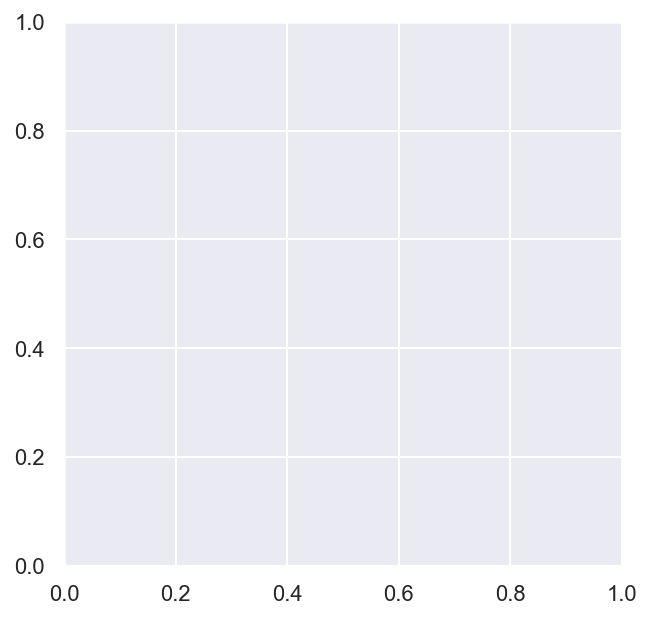

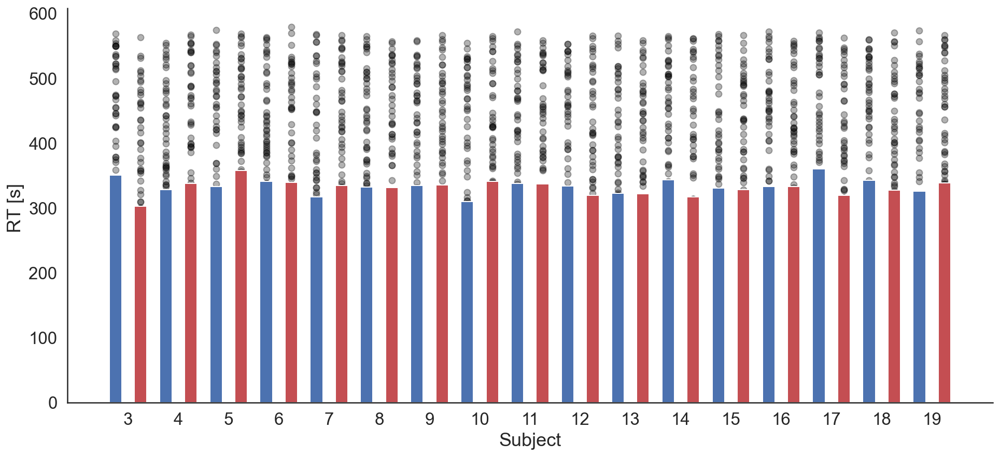

In [48]:
fig, ax = plt.subplots()
figure(figsize=(16,7))

sns.set(font_scale=1.5, style='white')

width = 0.25
#partNames = data_exp1.Part.unique()
partNames = range(3, 3+len(data_exp1["Part"].unique()))



for i in np.arange(len(partNames)):
    RT1 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 1) ].RT-3.5
    RT2 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 2) ].RT-3.5

    RT_mean1 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 1) ].RT.mean()-3.5
    RT_mean2 = data_exp1.loc[(data_exp1['Part'] == partNames[i]) & (data_exp1['frame'] == 2) ].RT.mean()-3.5
    print ('participant: ' + str(i))
    print ('RT frame 1: ' + str(RT_mean1))
    print ('RT frame 2: ' + str(RT_mean2))

    plt.bar(i-0.25, RT_mean1,width,color='b', label = 'Like')

    plt.scatter([i-0.25]*len(RT1),RT1 ,color='black', alpha=0.3, marker='o', label = 'Like')


    plt.bar(i+0.25, RT_mean2,width,color='r', label = 'Dislike')
    plt.scatter([i+0.25]*len(RT2),RT2 ,color='black', alpha=0.3, marker='o', label = 'Dislike')

plt.xticks(range(len(partNames)), partNames)
plt.xlabel("Subject")
plt.ylabel("RT [s] ")
#plt.xticks([i-0.5,i+0.5],["Like ","Dislike"], rotation=0, fontsize=25)
#plt.legend()
sns.despine()

## 3. participant densities rate 

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

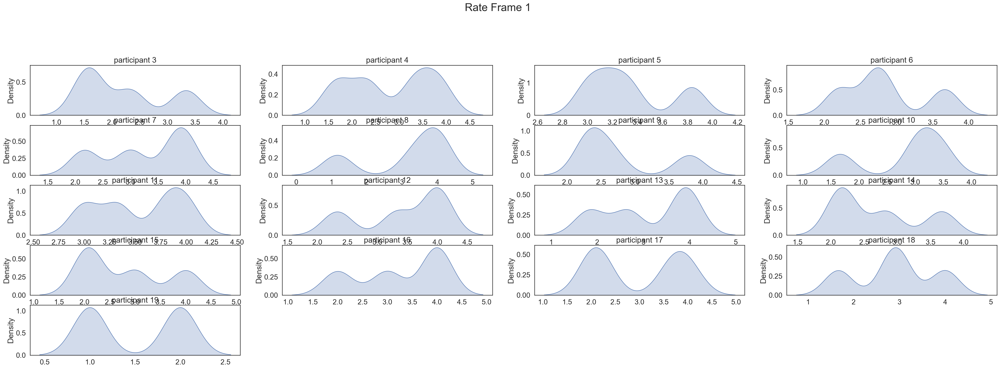

In [49]:
participant_densities(data_exp1,'RRat1', title = 'Rate Frame 1')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

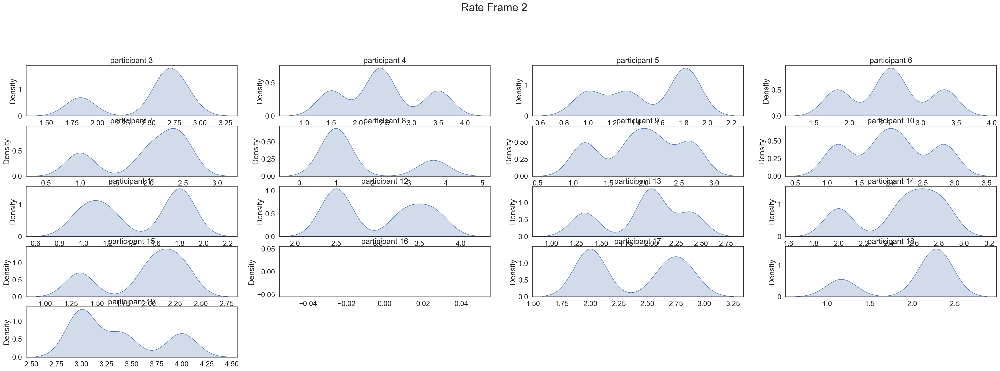

In [50]:
participant_densities(data_exp1,'RRat2', title = 'Rate Frame 2 ')

## 4. participants densities variability 
## (variability corresponds to the standard deviation of the ratings for each pet)

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

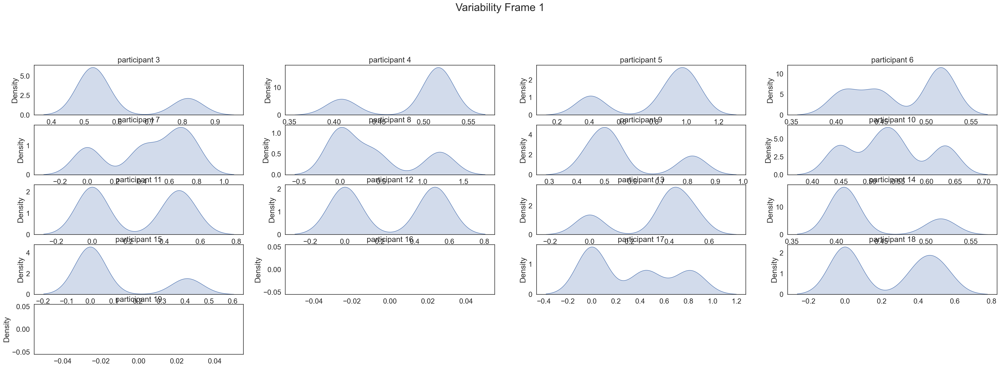

In [51]:
participant_densities(data_exp1,'RVar1', title = 'Variability Frame 1')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

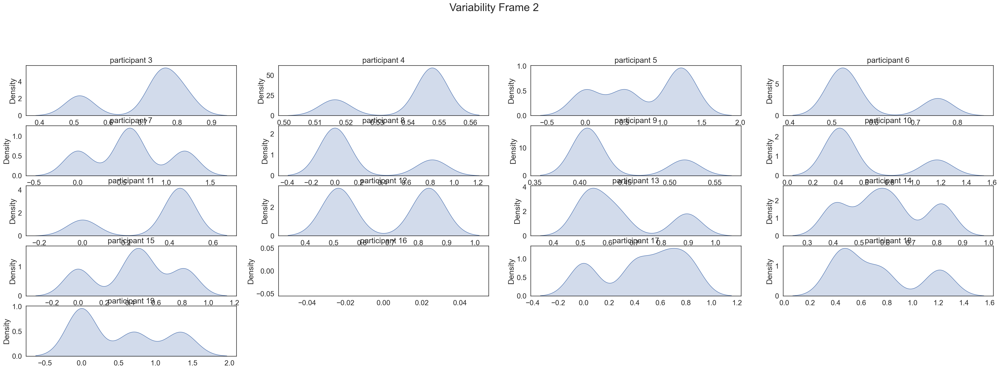

In [52]:
participant_densities(data_exp1,'RVar2', title = 'Variability Frame 2')

## 5.Pet ratings (value)

### Compare Value Online vs Exemplar value

Pearson's r = 0.61 p =  0.0
Pearson's r = 0.502 p =  0.0
Pearson's r = 0.052 p =  0.476
Pearson's r = 0.416 p =  0.0
Pearson's r = 0.387 p =  0.0
Pearson's r = 0.171 p =  0.018
Pearson's r = -0.013 p =  0.861
Pearson's r = 0.318 p =  0.0
Pearson's r = 0.535 p =  0.0
Pearson's r = 0.094 p =  0.196
Pearson's r = -0.006 p =  0.93
Pearson's r = 0.61 p =  0.0
Pearson's r = 0.339 p =  0.0
Pearson's r = 0.285 p =  0.0
Pearson's r = 0.134 p =  0.064
Pearson's r = 0.427 p =  0.0
Pearson's r = 0.359 p =  0.0


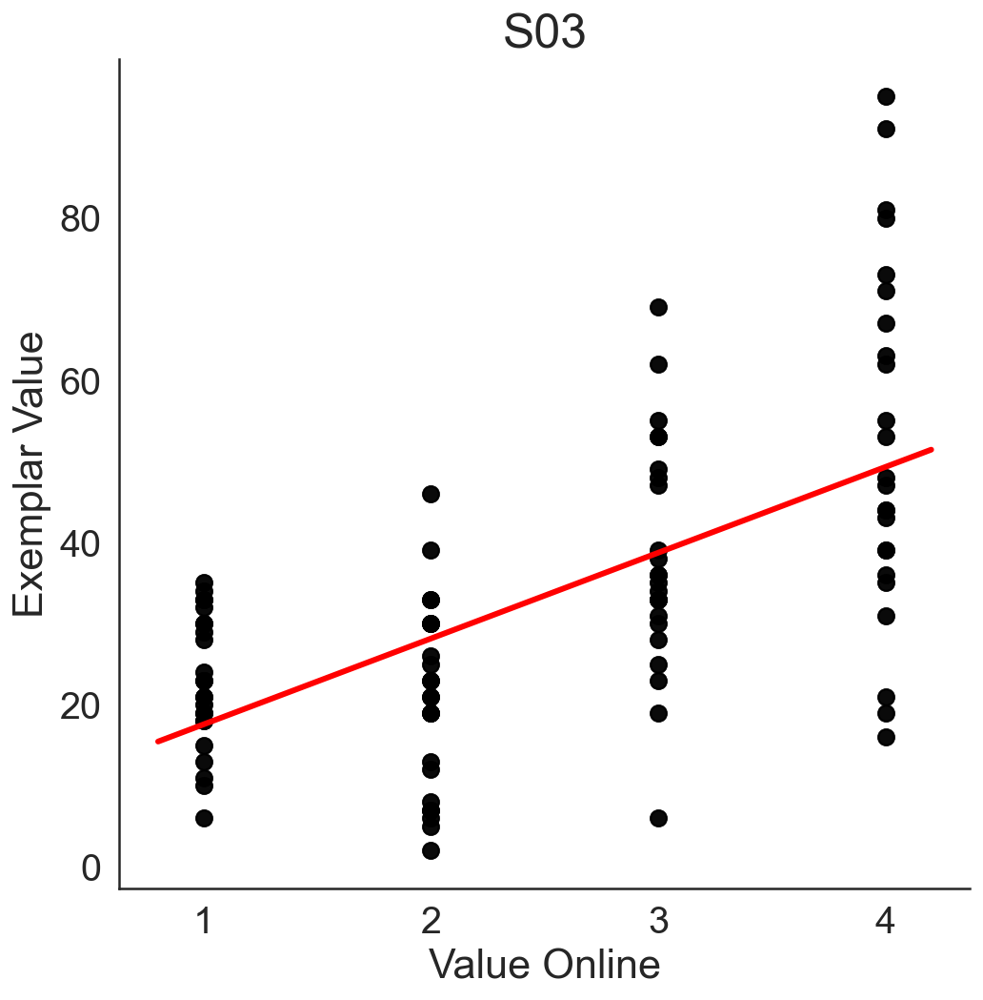

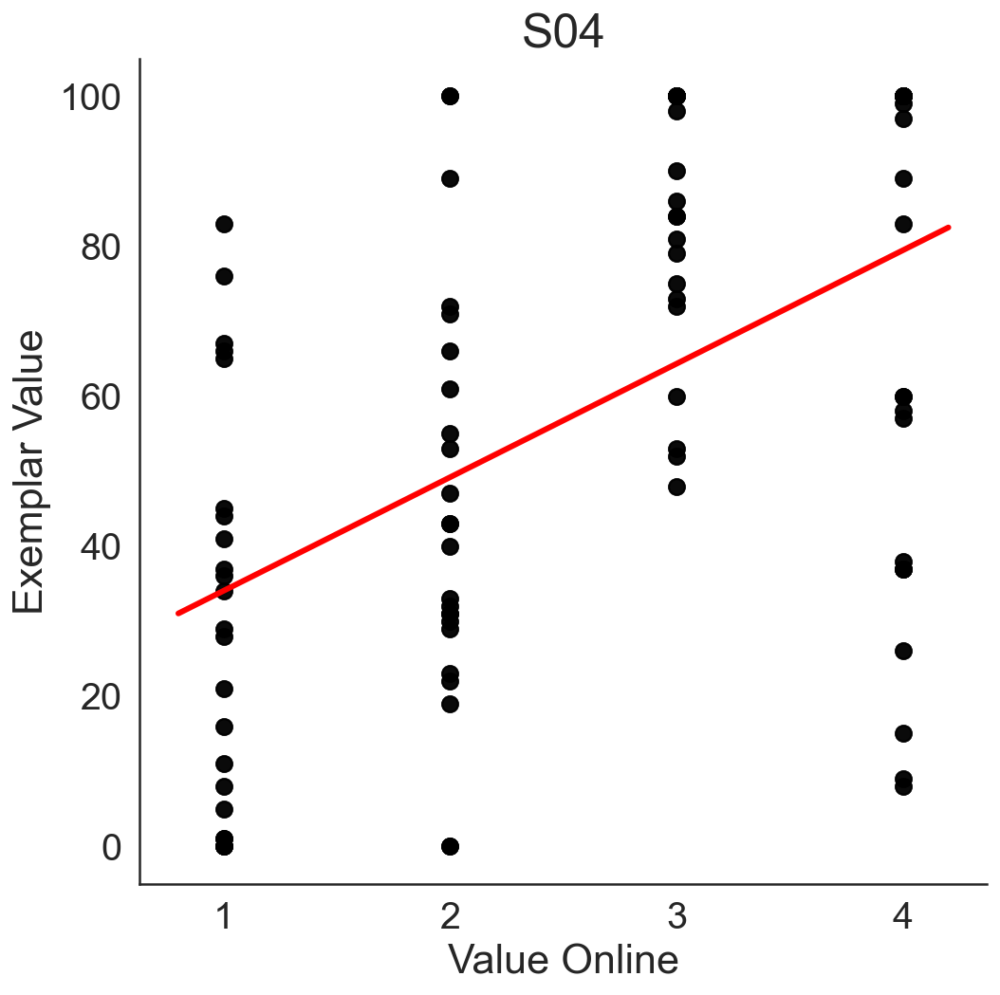

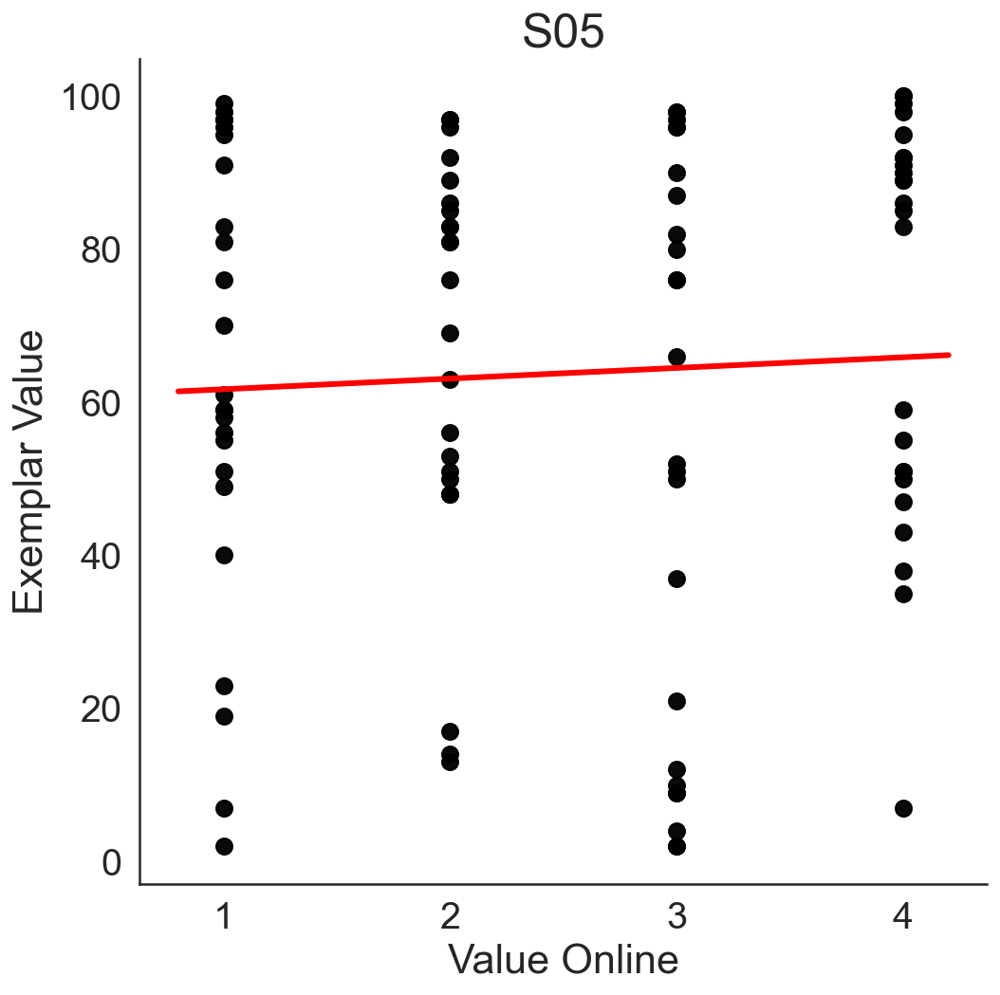

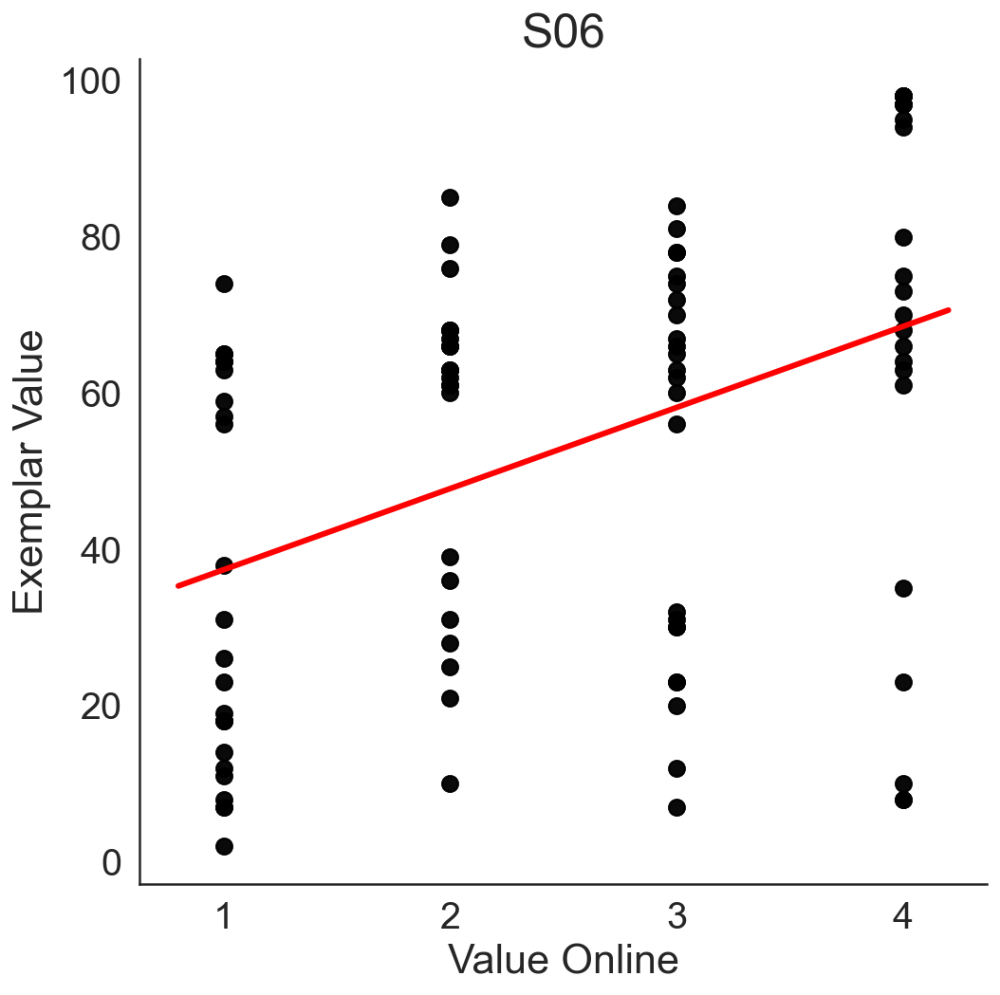

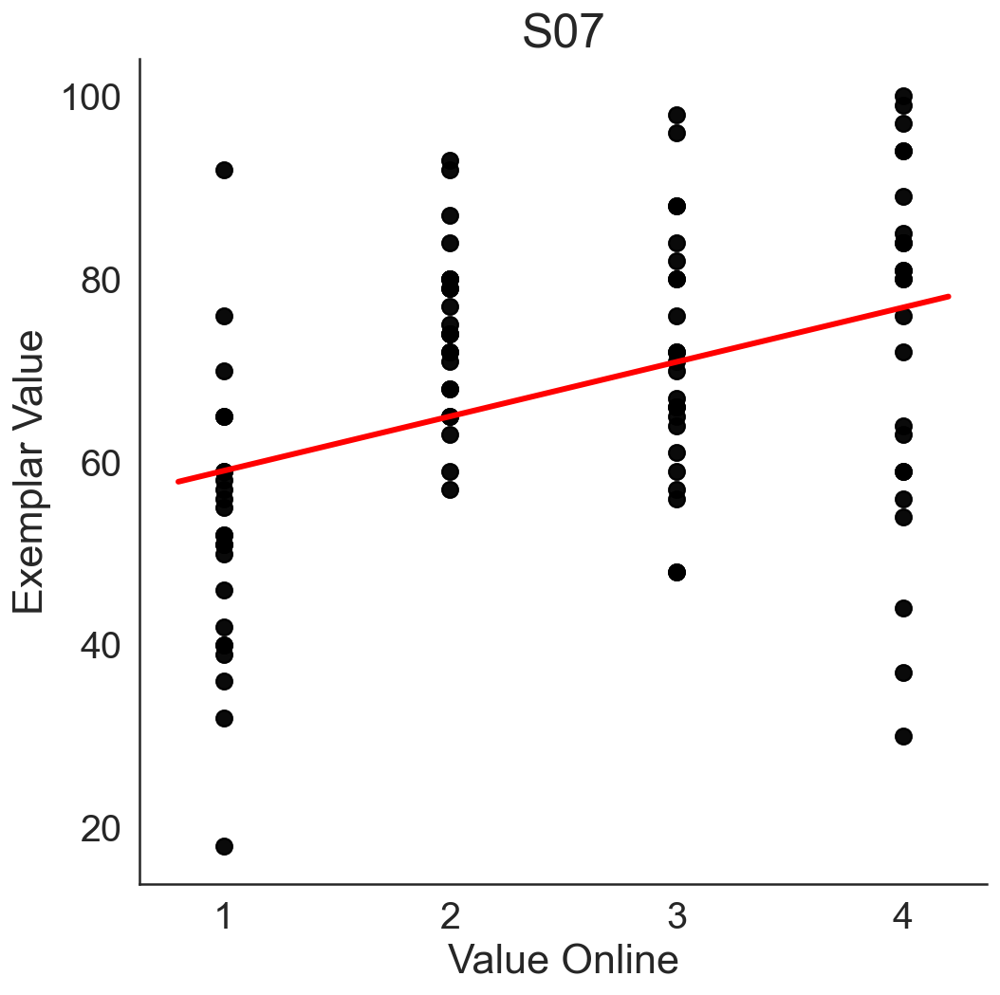

...

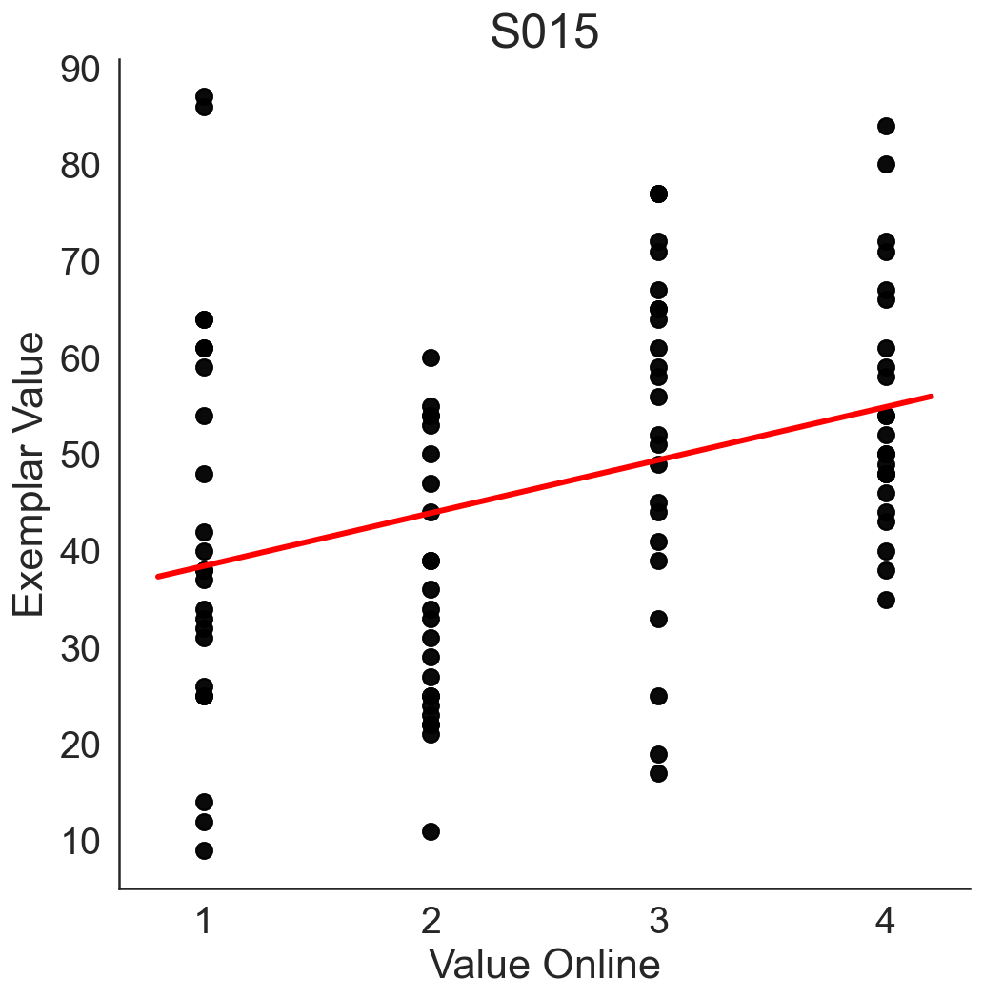

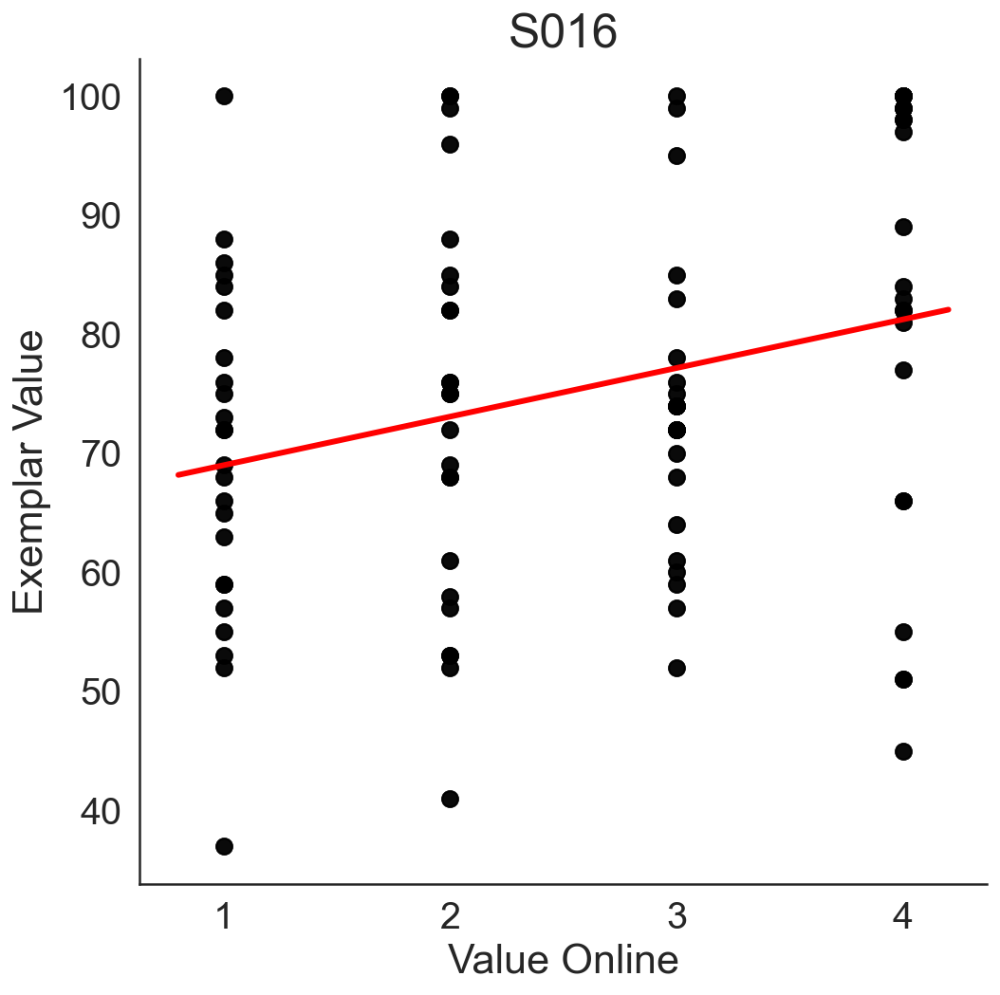

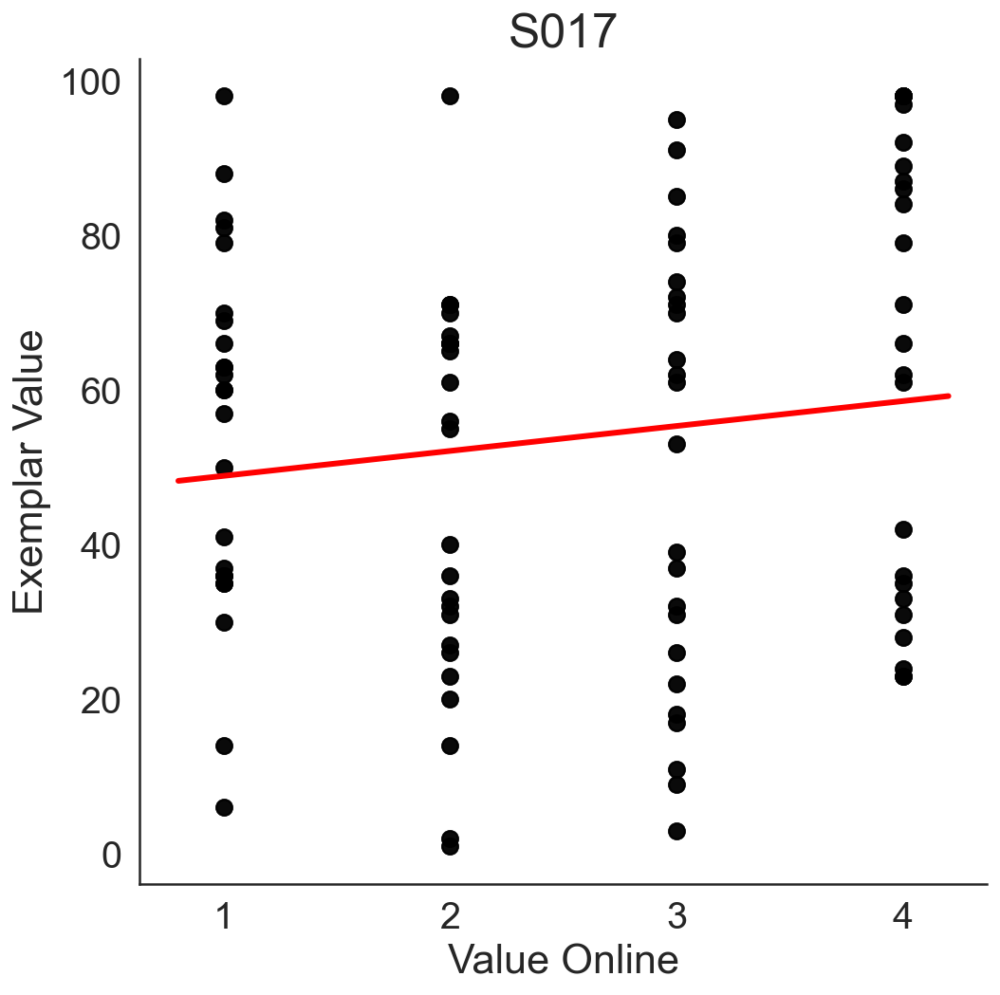

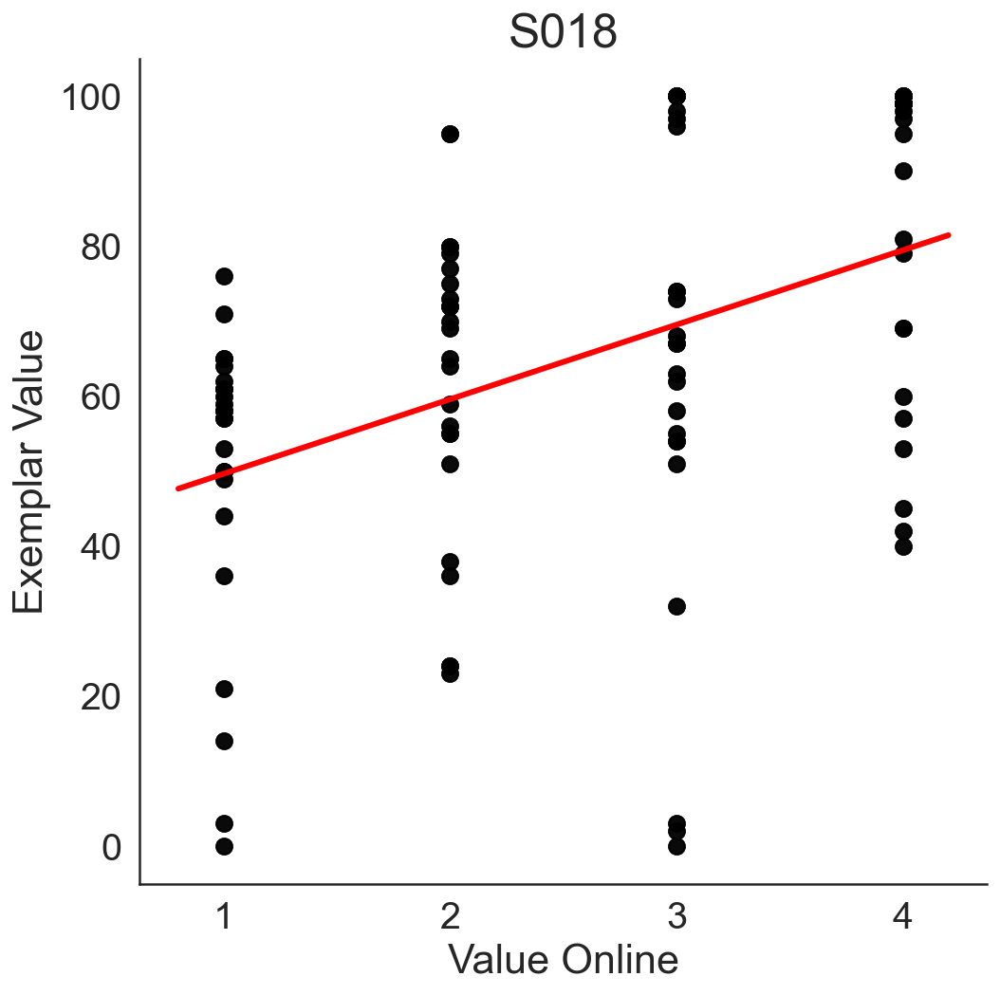

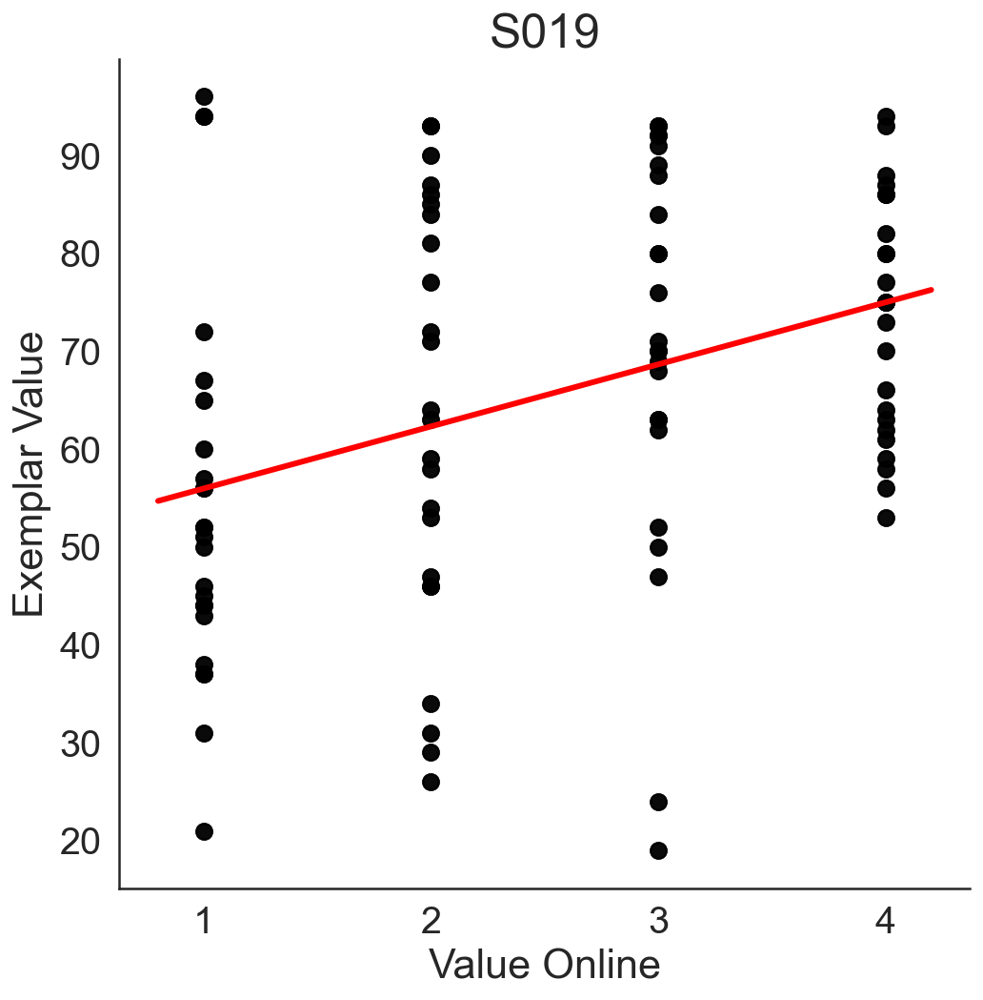

In [104]:
#corrPlotSimple(data_exp_ratings_2, 'rat1','Ratings Frame 1','rat2','Ratings Frame 2')
for part in data_exp1["Part"].unique(): 

    corrPlotSimple(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'ValOnl','Value Online','ExVal','Exemplar Value', title = 'S0'+str(part))


### Compare Value Rating Like (in task) vs Value Online

Pearson's r = 0.905 p =  0.0
Pearson's r = 0.993 p =  0.0
Pearson's r = -0.0 p =  1.0
Pearson's r = 0.964 p =  0.0
Pearson's r = 0.917 p =  0.0
Pearson's r = 0.881 p =  0.0
Pearson's r = 0.878 p =  0.0
Pearson's r = 0.845 p =  0.0
Pearson's r = 0.99 p =  0.0
Pearson's r = 0.929 p =  0.0
Pearson's r = 0.926 p =  0.0
Pearson's r = 0.937 p =  0.0
Pearson's r = 0.915 p =  0.0
Pearson's r = 0.944 p =  0.0
Pearson's r = 0.951 p =  0.0
Pearson's r = 0.968 p =  0.0
Pearson's r = 0.894 p =  0.0


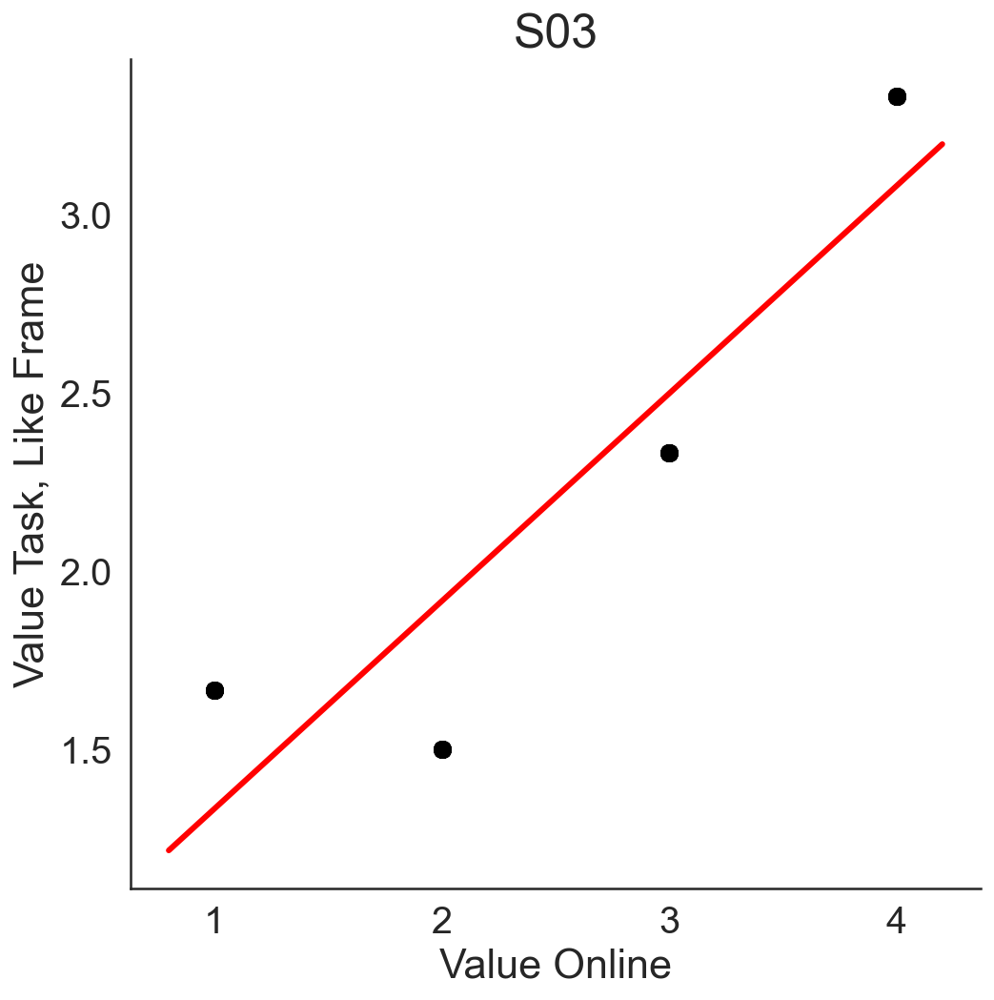

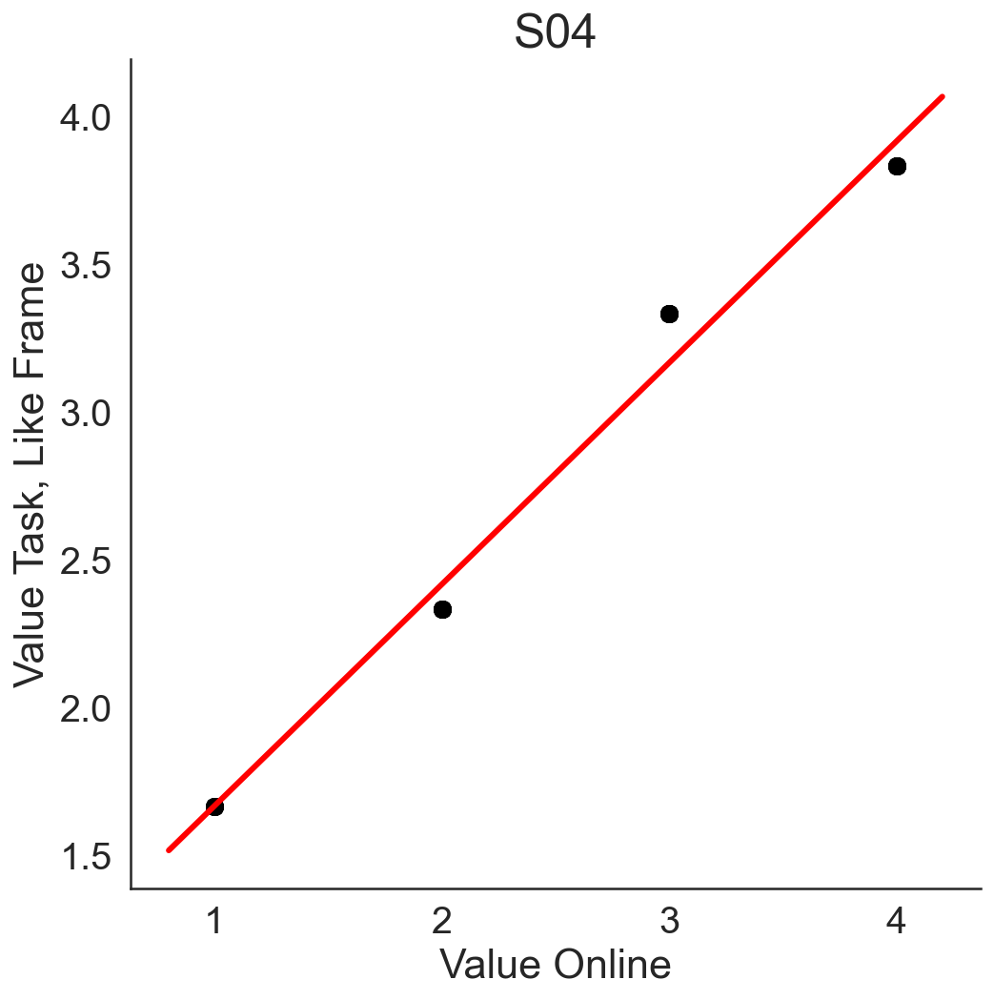

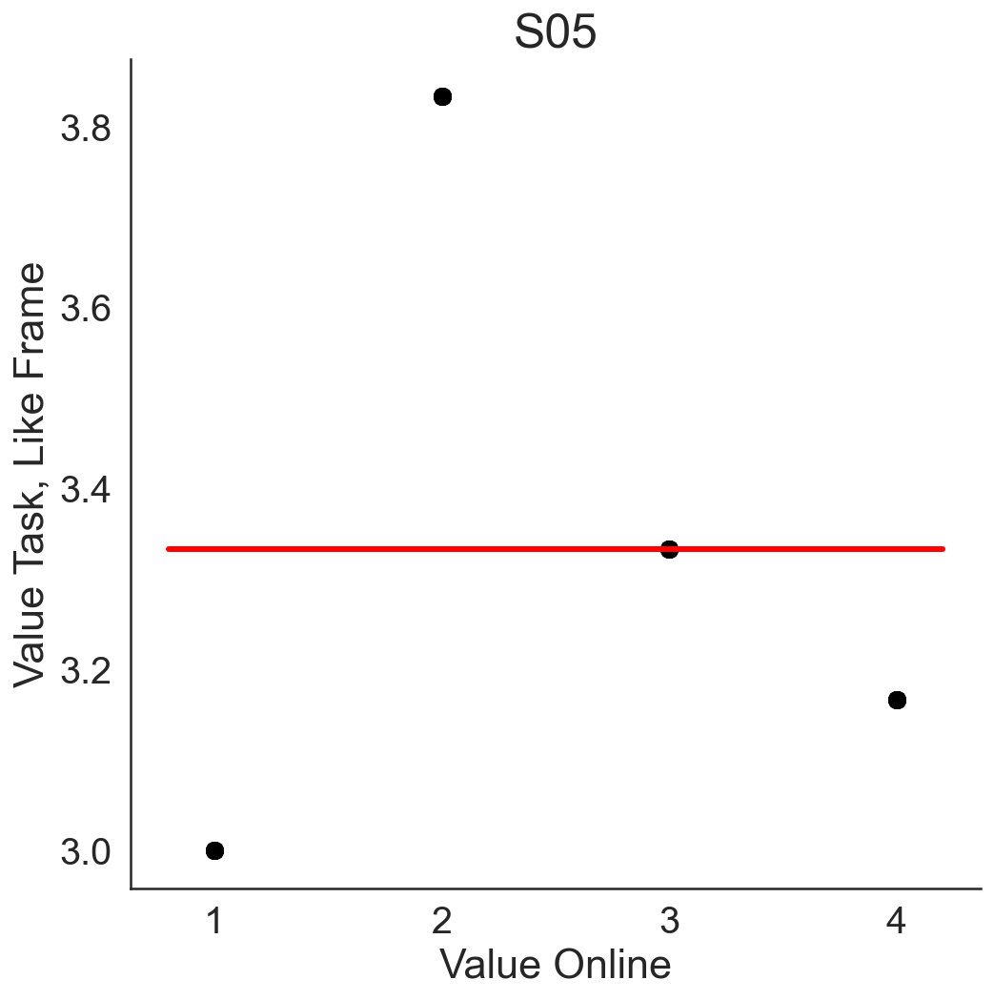

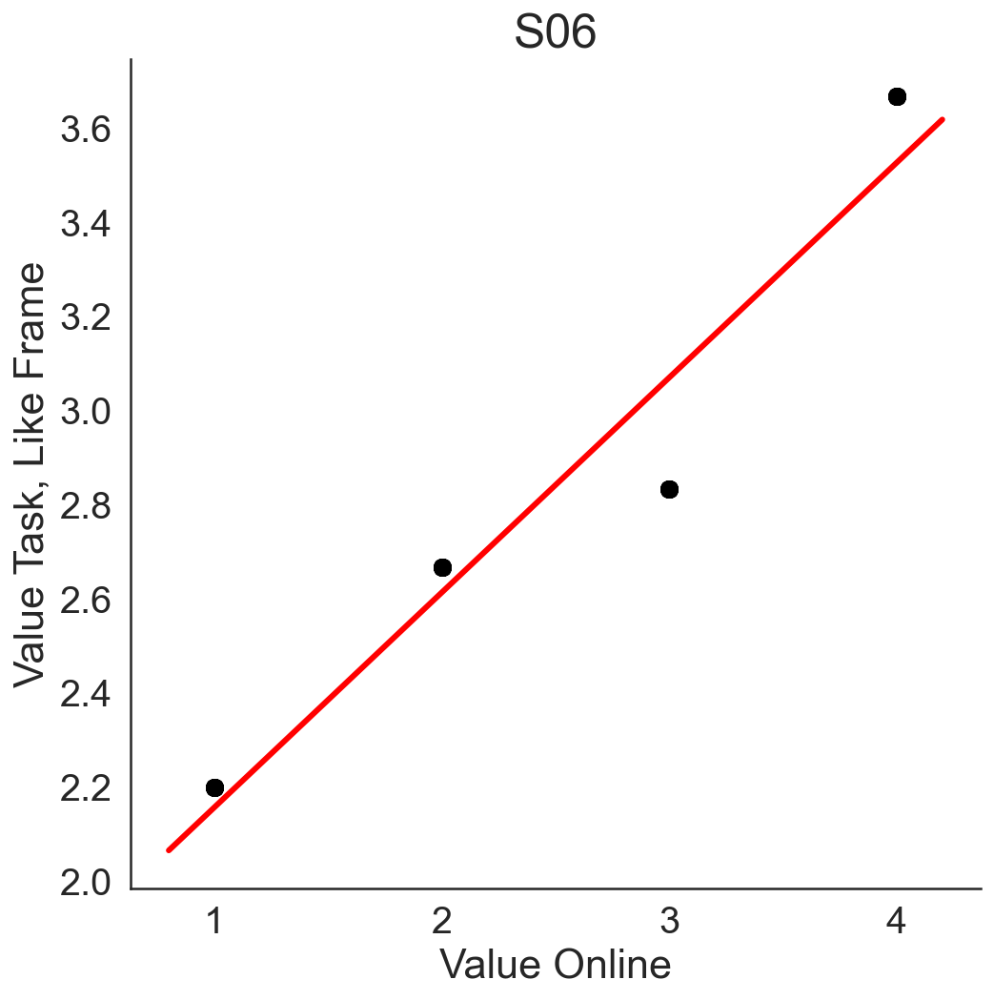

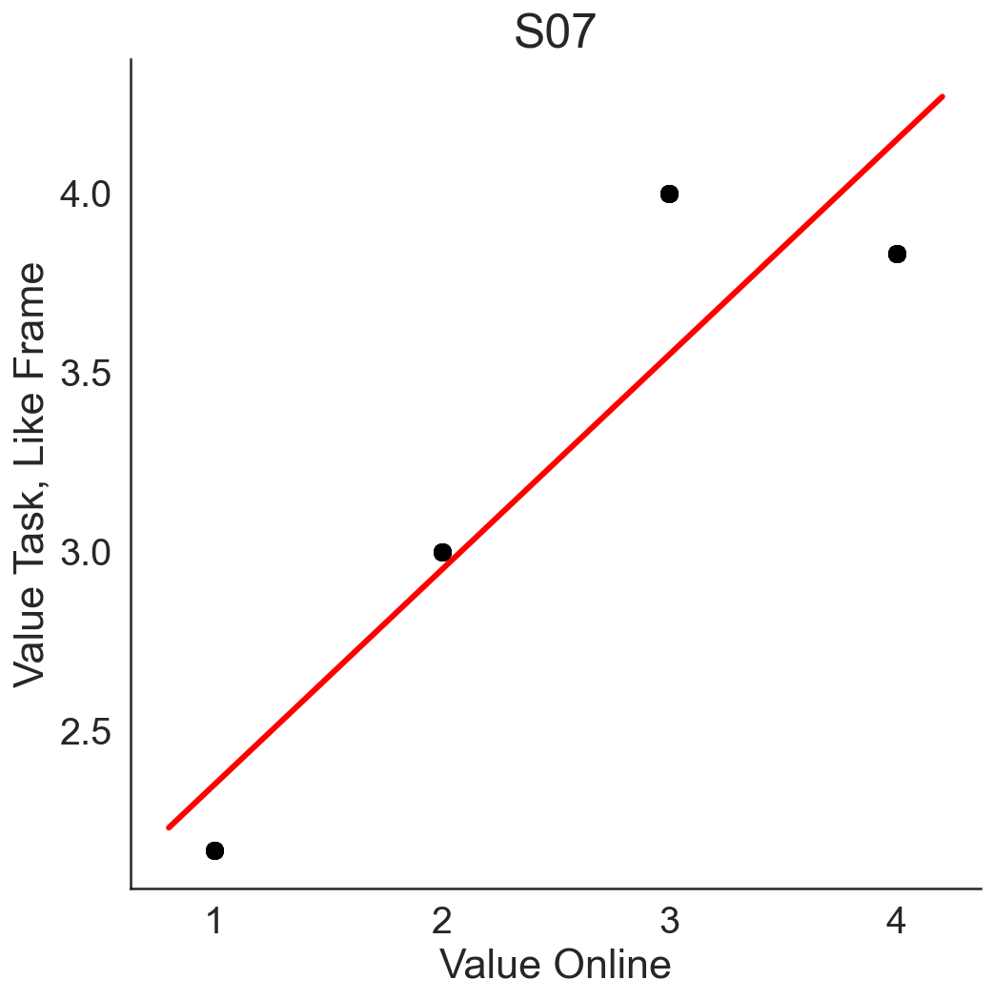

...

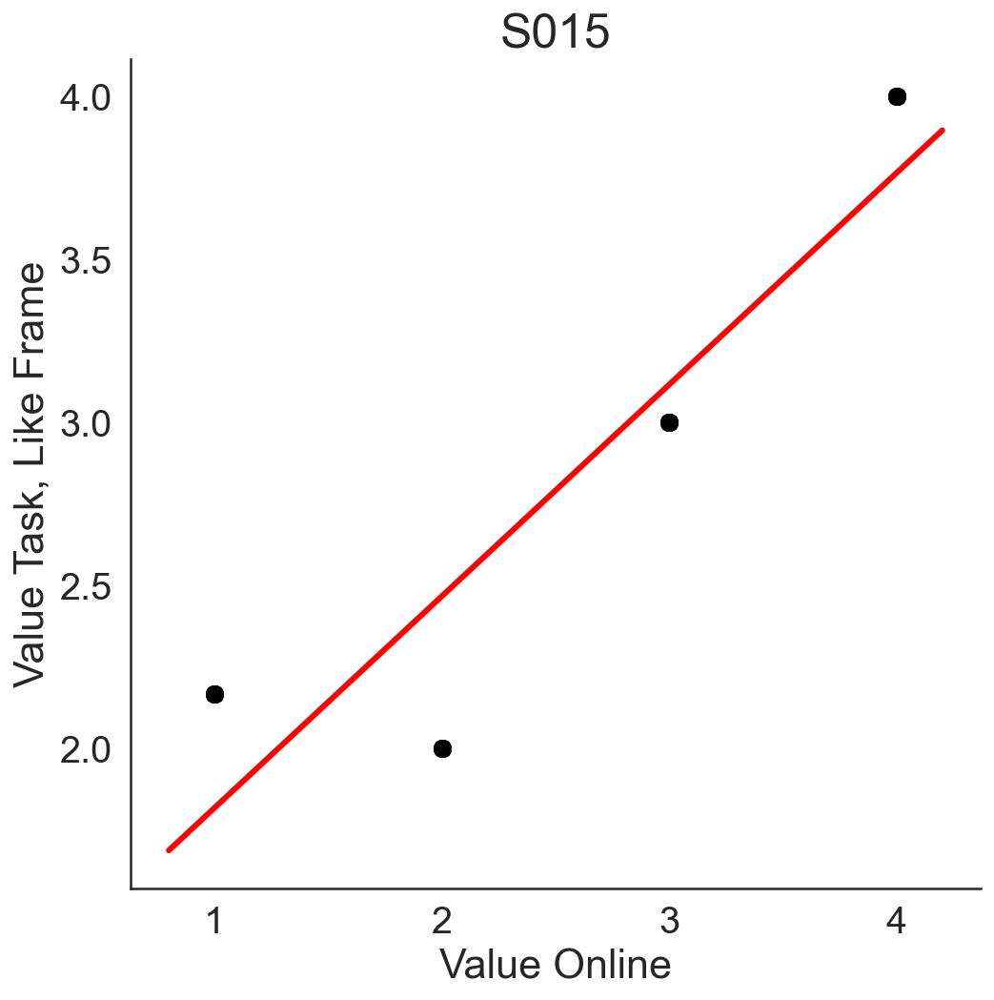

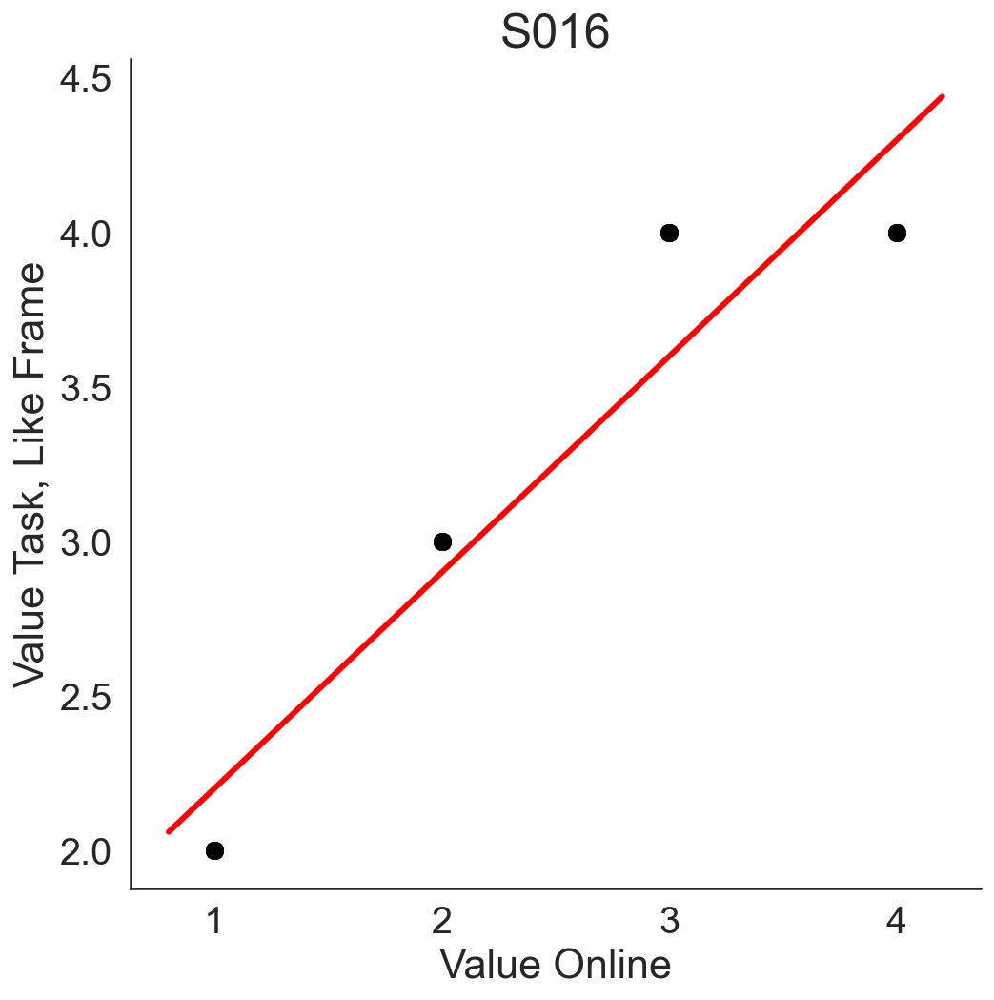

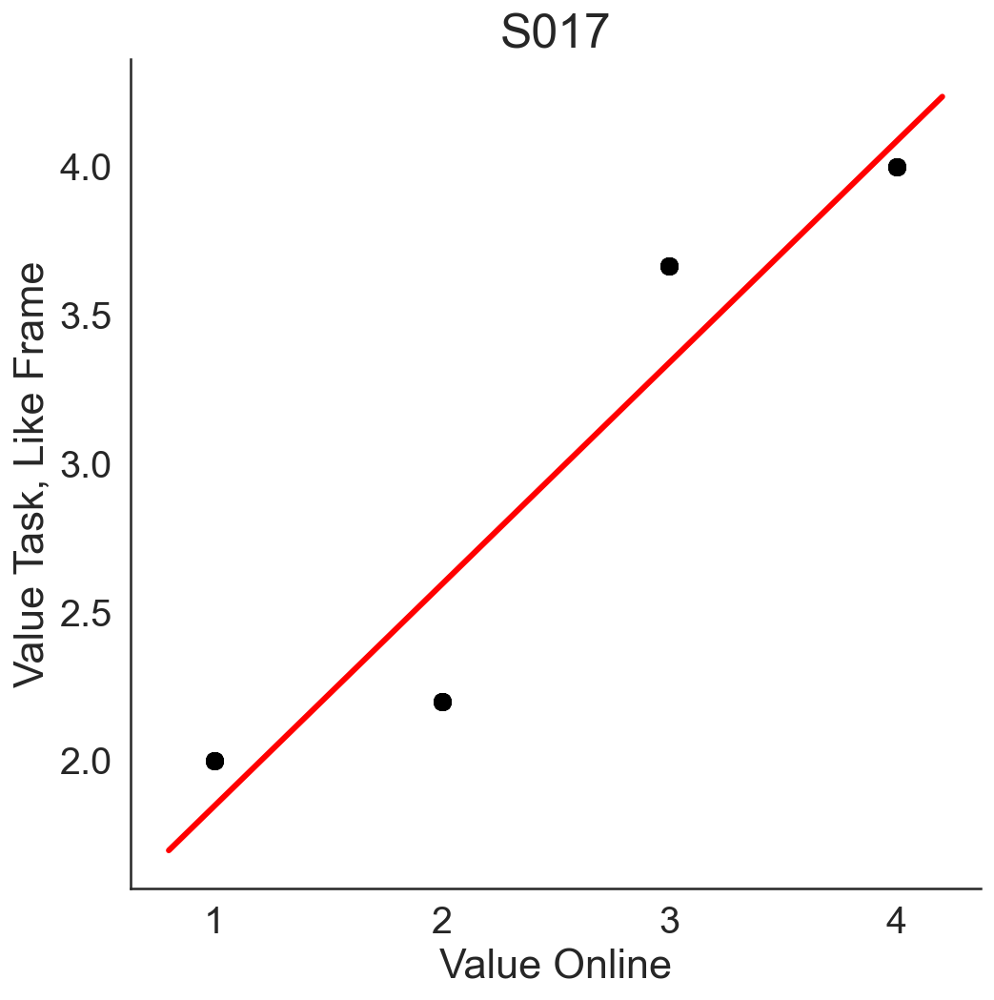

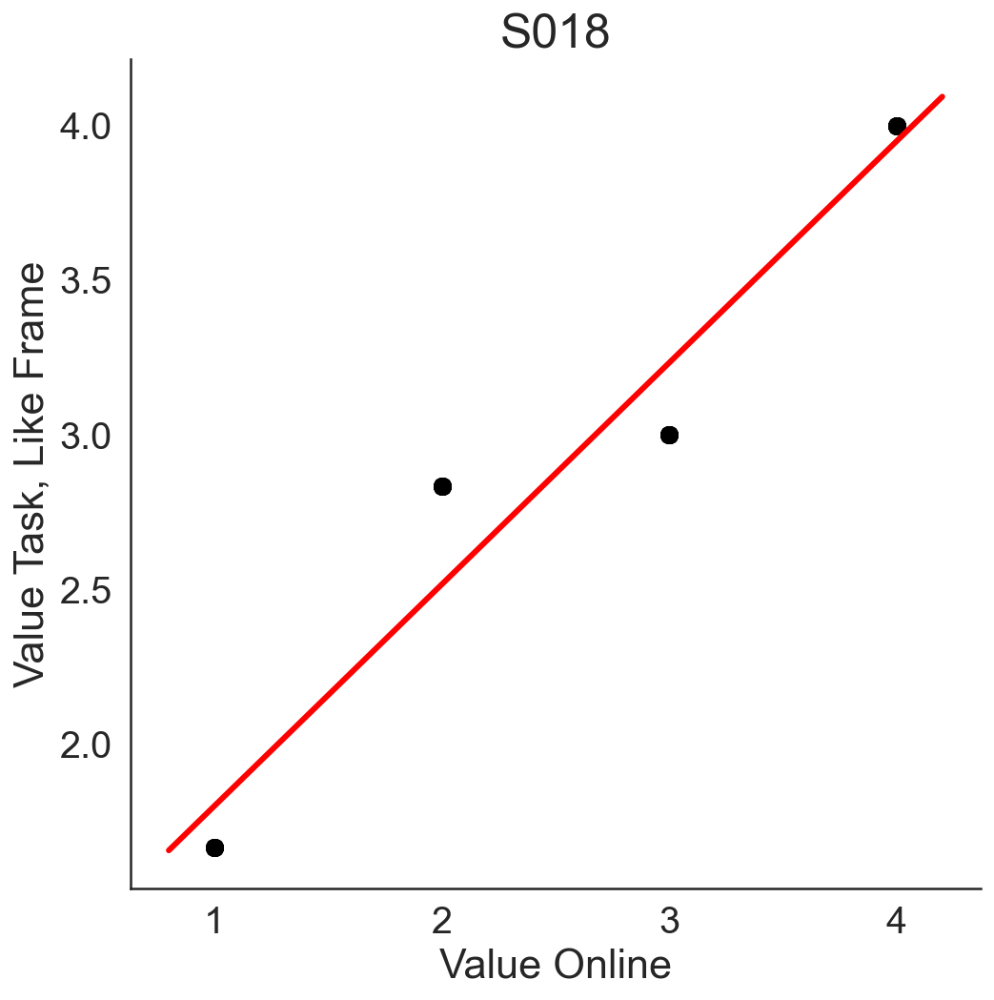

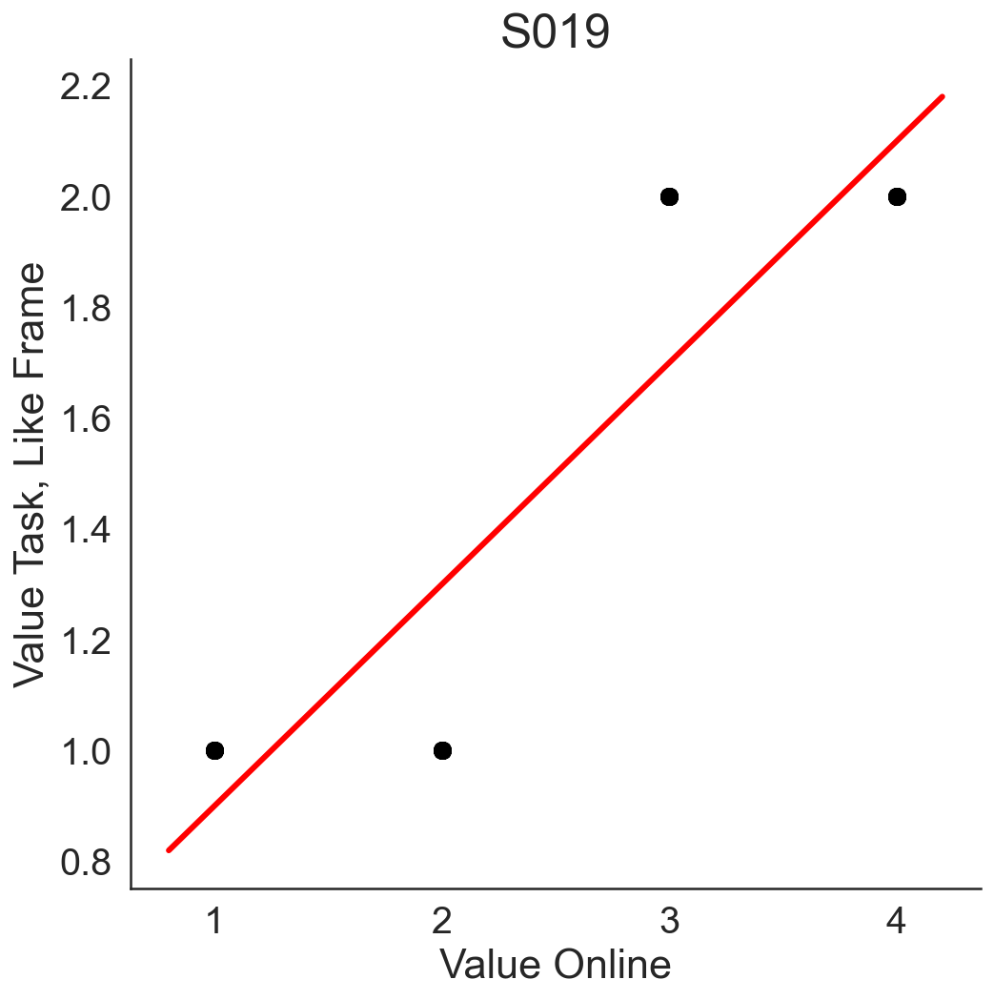

In [103]:
#corrPlotSimple(data_exp_ratings_2, 'rat1','Ratings Frame 1','rat2','Ratings Frame 2')
for part in data_exp1["Part"].unique(): 

    corrPlotSimple(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'ValOnl','Value Online','Val1','Value Task, Like Frame', title = 'S0'+str(part))


### Compare Value Rating Dislike (in task) vs Value Online

Pearson's r = -0.858 p =  0.0
Pearson's r = 0.97 p =  0.0
Pearson's r = 0.743 p =  0.0
Pearson's r = -0.978 p =  0.0
Pearson's r = -0.865 p =  0.0
Pearson's r = -0.775 p =  0.0
Pearson's r = -0.992 p =  0.0
Pearson's r = -0.868 p =  0.0
Pearson's r = -0.939 p =  0.0
Pearson's r = -0.218 p =  0.002
Pearson's r = 0.467 p =  0.0
Pearson's r = -0.837 p =  0.0
Pearson's r = -0.933 p =  0.0
Pearson's r = nan p =  nan
Pearson's r = -0.834 p =  0.0
Pearson's r = -0.844 p =  0.0
Pearson's r = -0.929 p =  0.0


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


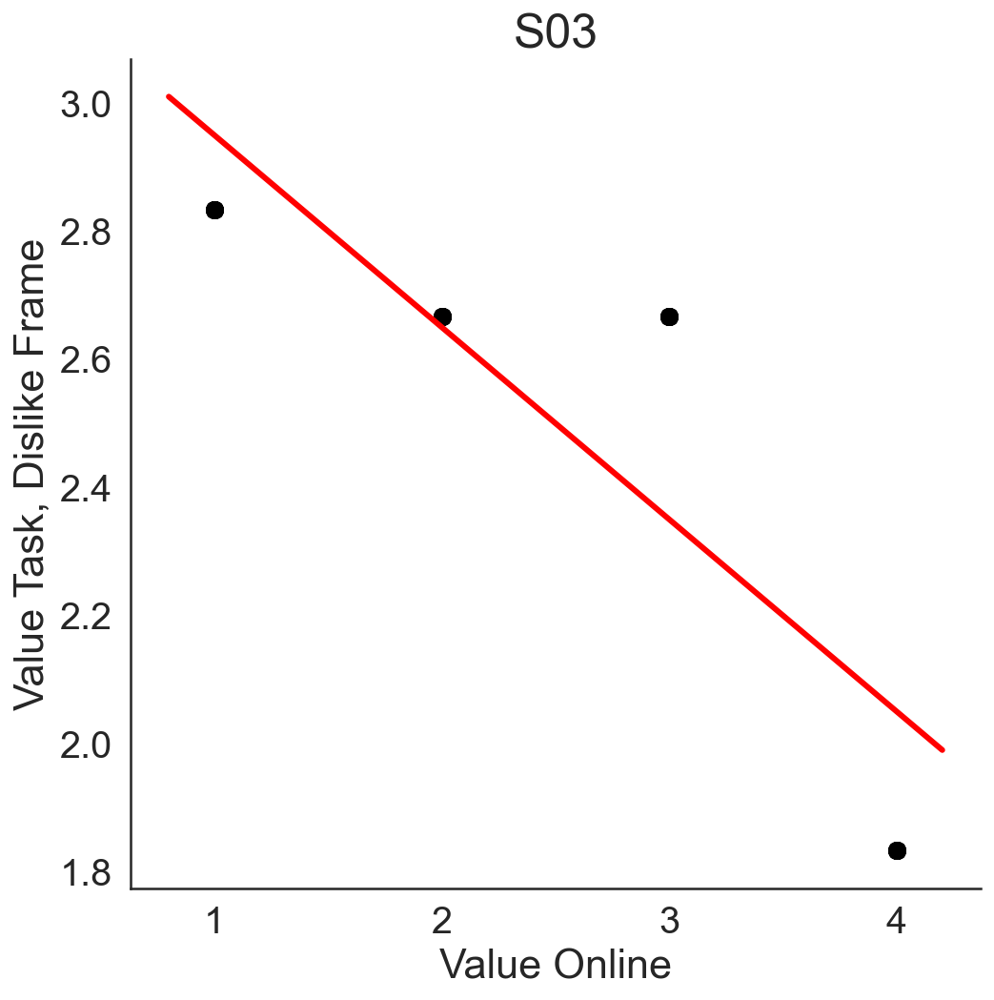

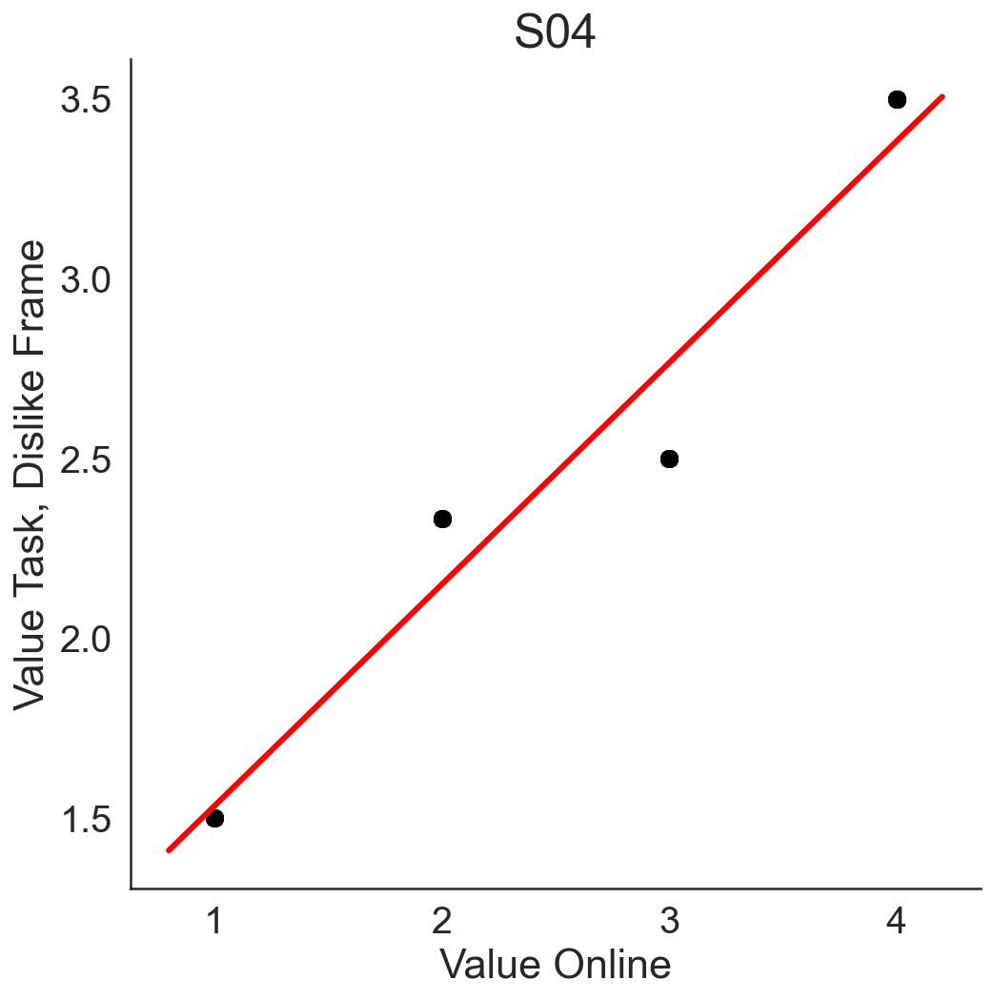

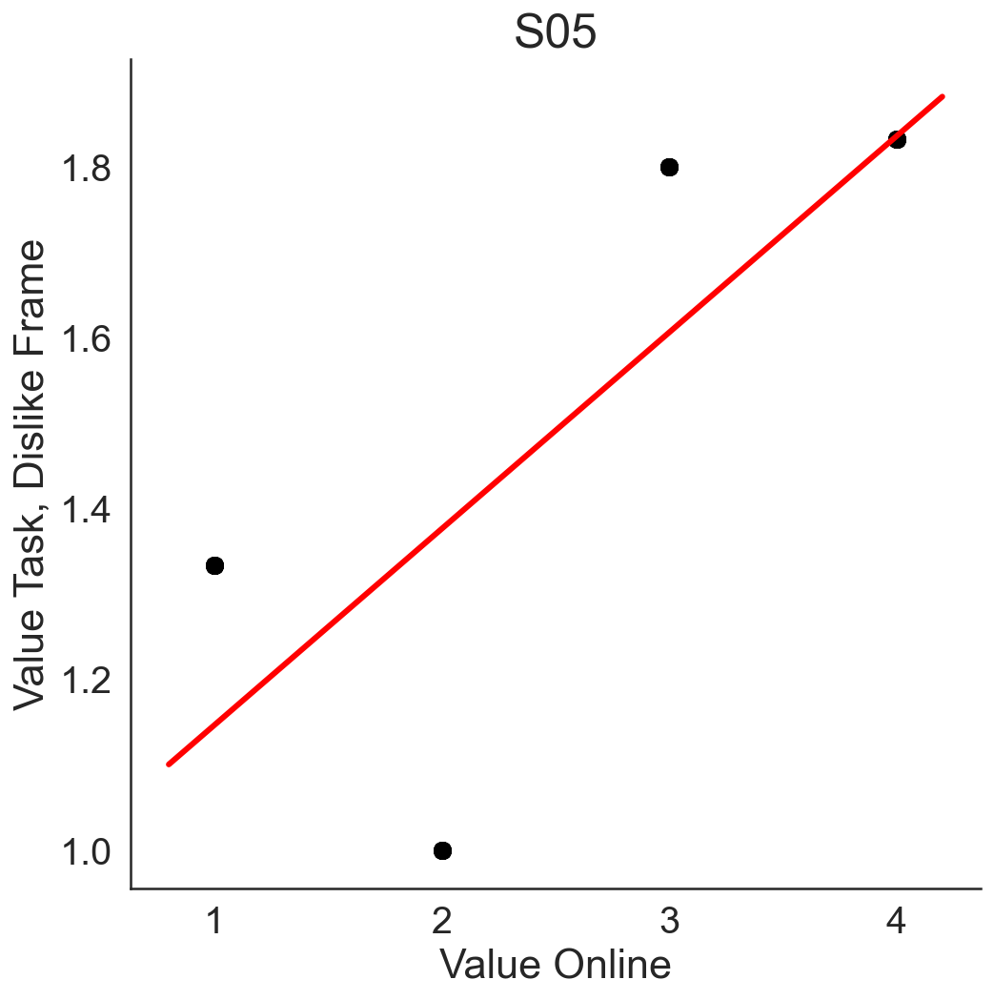

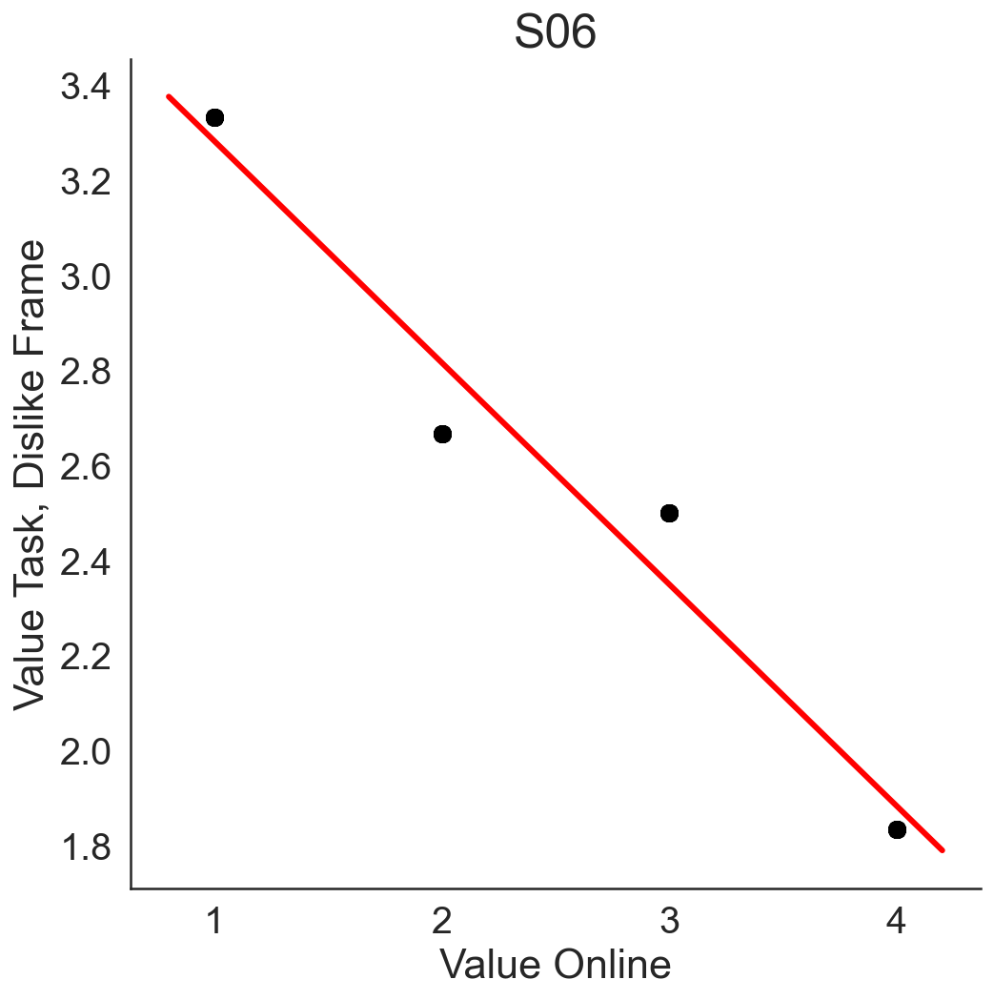

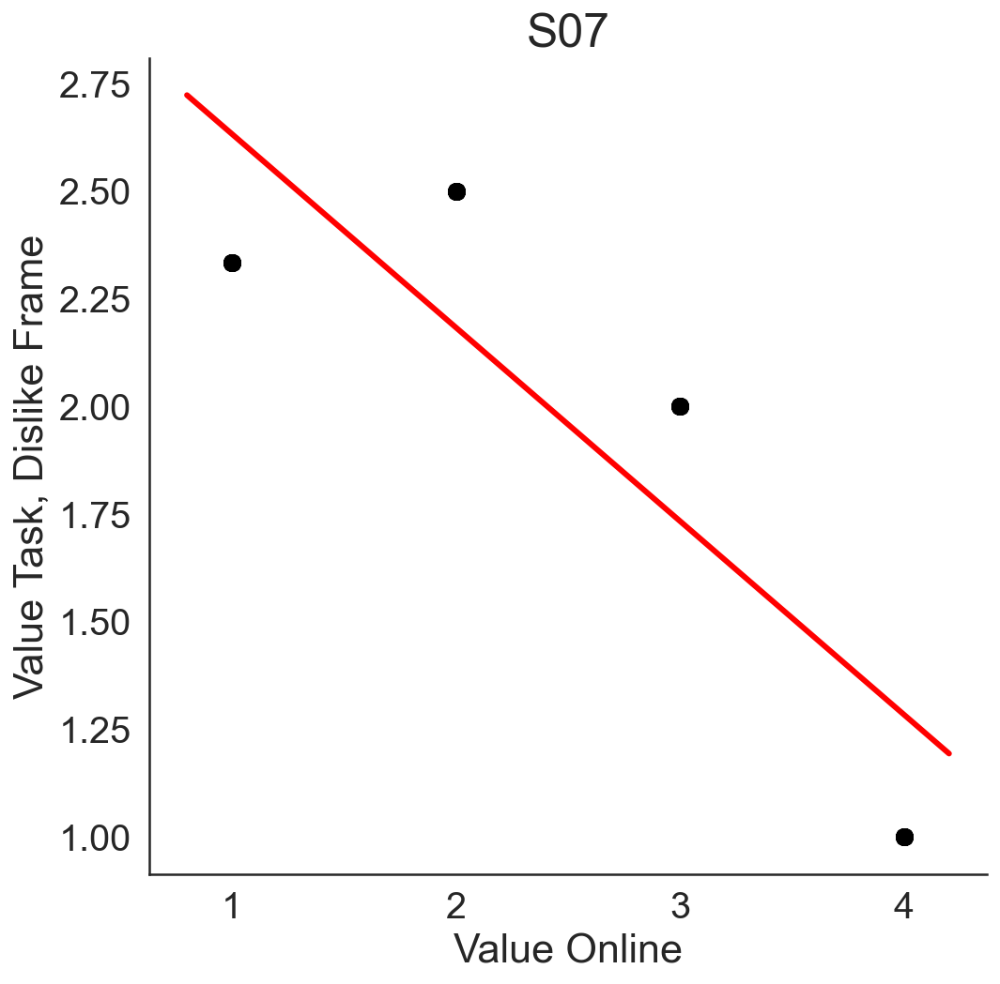

...

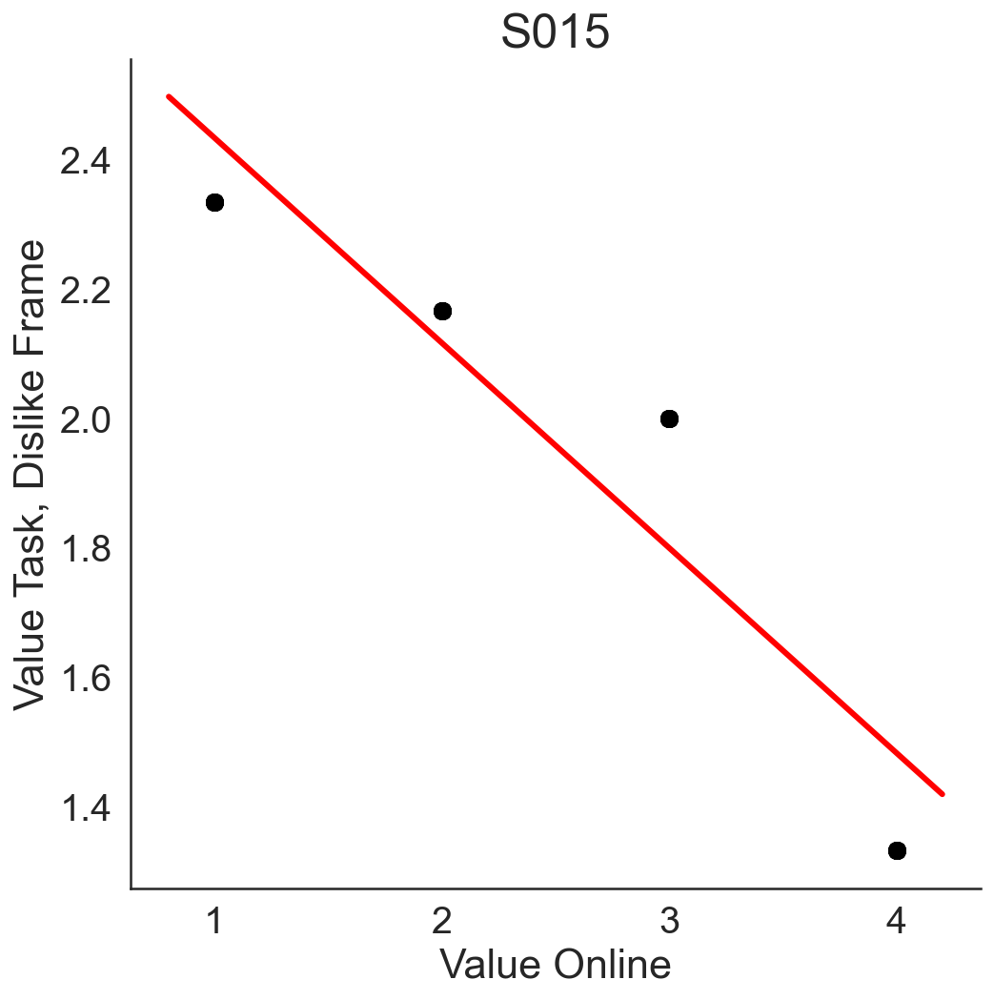

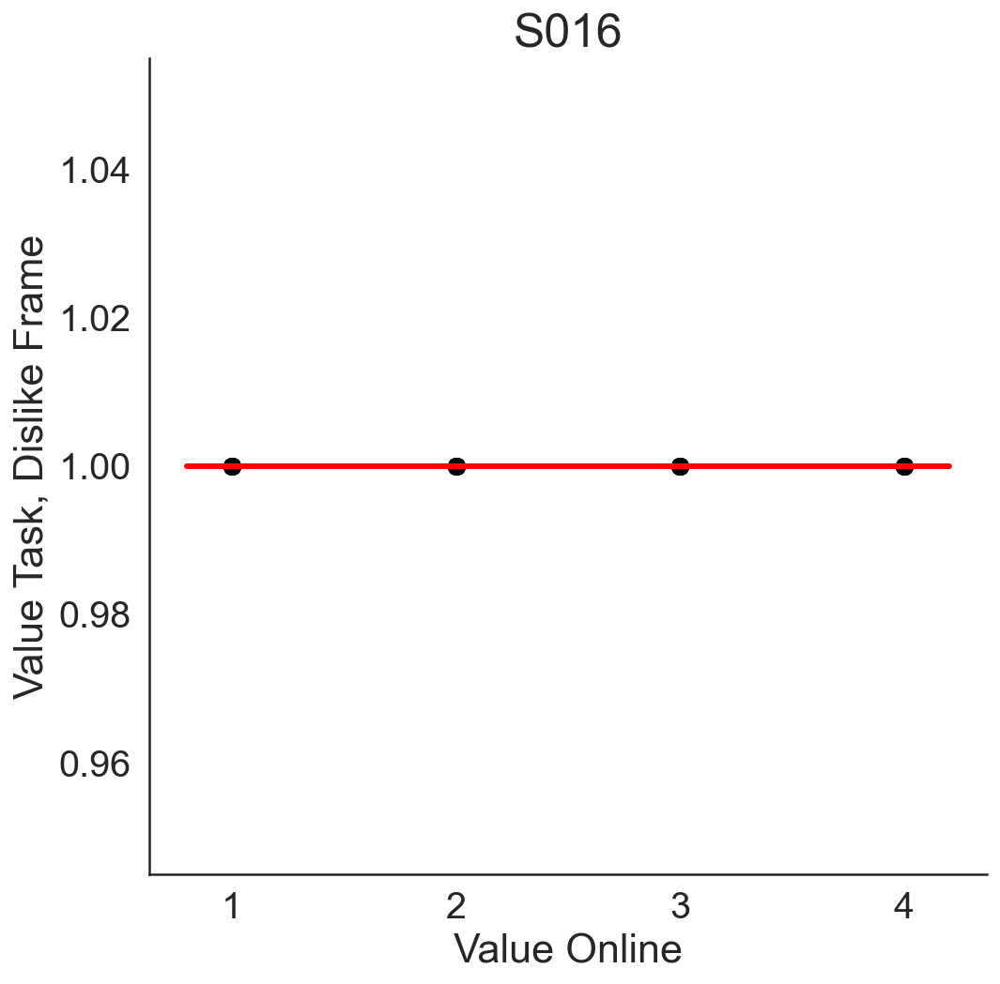

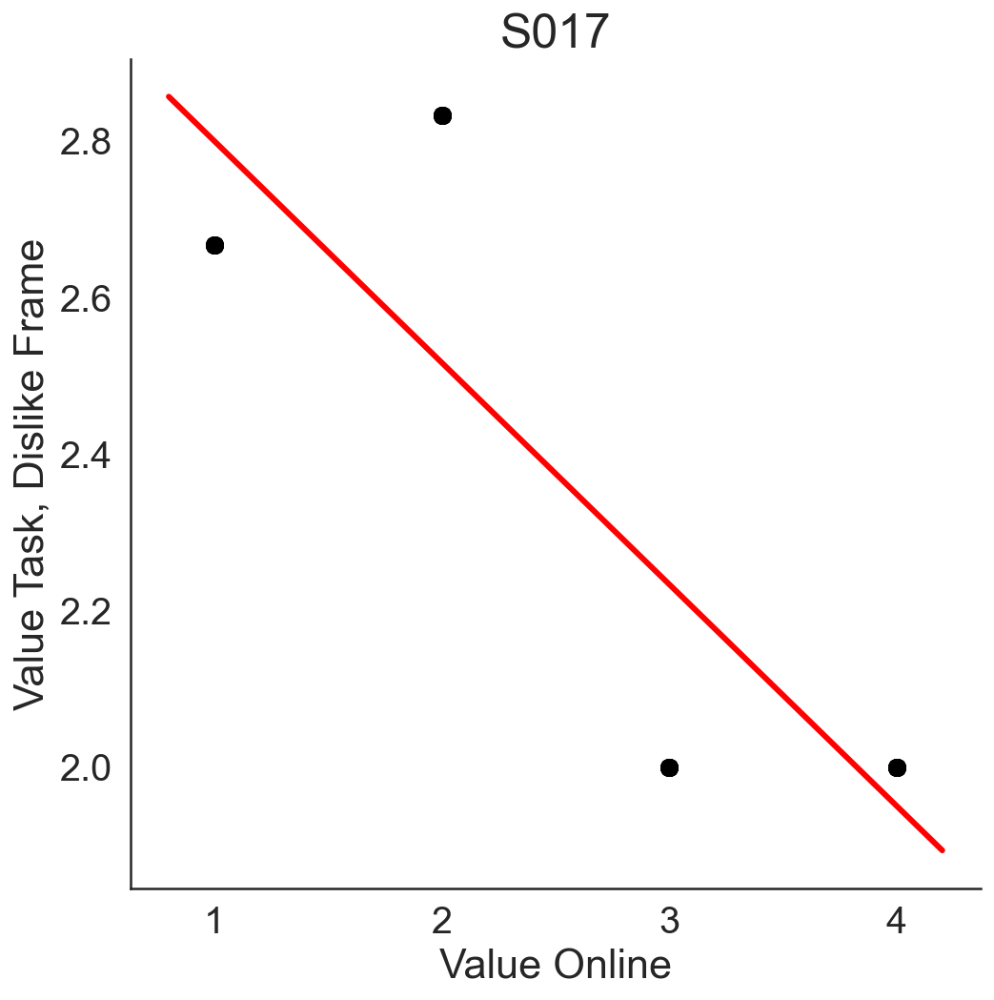

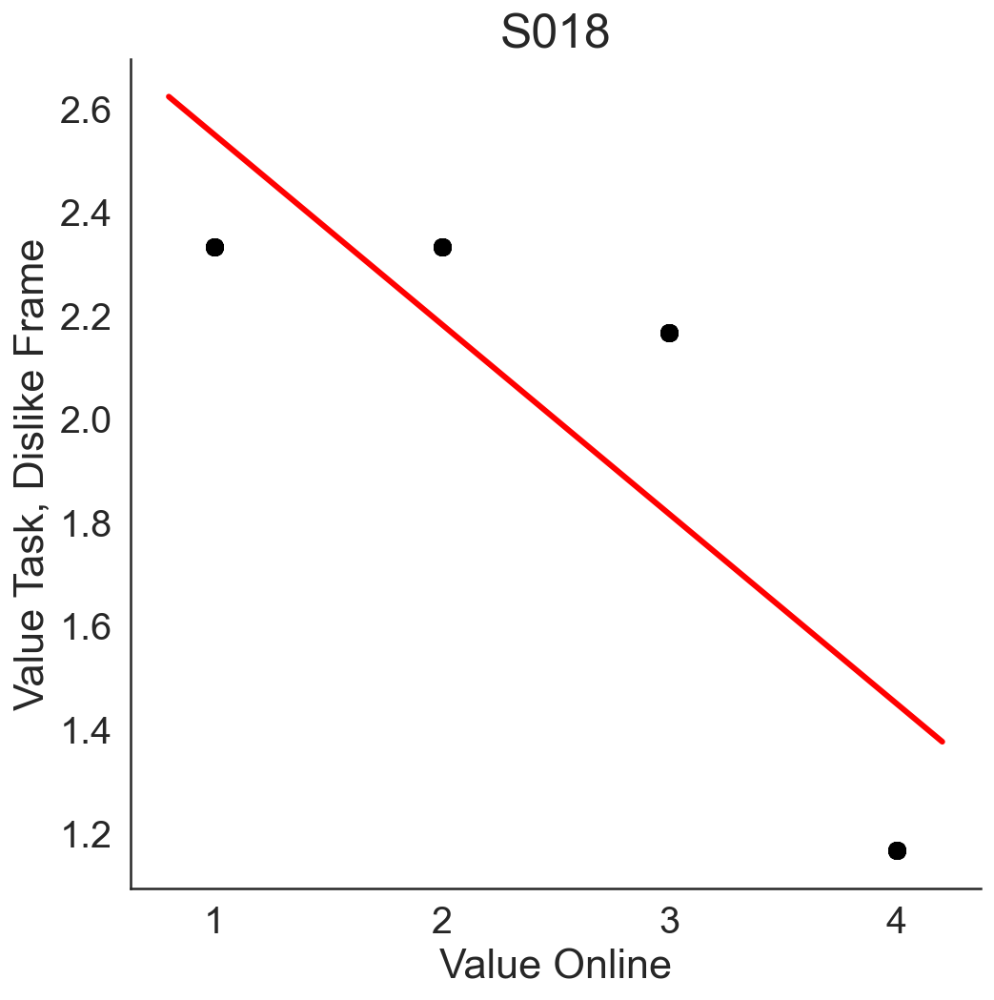

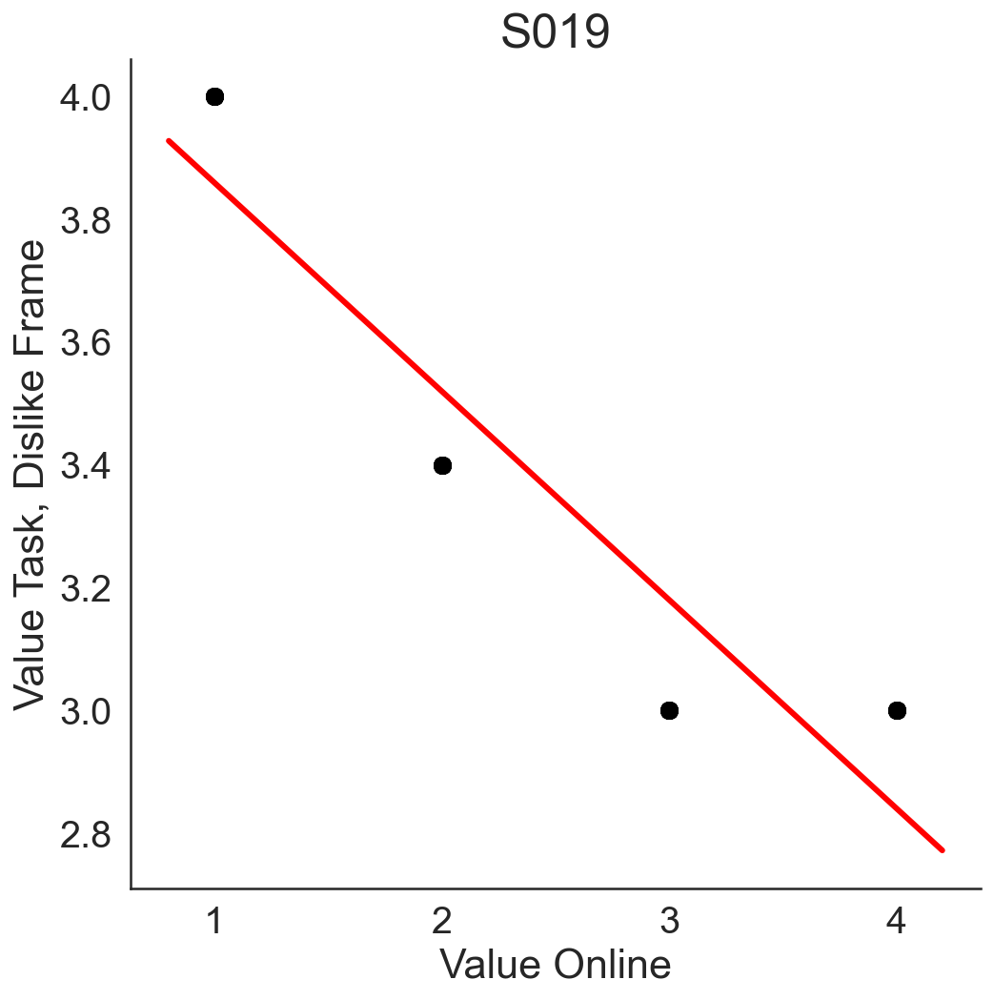

In [105]:
#corrPlotSimple(data_exp_ratings_2, 'rat1','Ratings Frame 1','rat2','Ratings Frame 2')
for part in data_exp1["Part"].unique(): 

    corrPlotSimple(data_exp_ratings_2.loc[(data_exp_ratings_2['Part'] == part)], 'ValOnl','Value Online','Val2','Value Task, Dislike Frame', title = 'S0'+str(part))


## use only rating trials

In [112]:
data_exp_onlyRat = data_exp_ratings_2.loc[data_exp_ratings_2['rating']>0].copy()

In [113]:
data_exp_onlyRatL = data_exp_onlyRat.loc[data_exp_onlyRat['frame'] == 1].copy()
data_exp_onlyRatD = data_exp_onlyRat.loc[data_exp_onlyRat['frame'] == 2].copy()

Pearson's r = 0.715 p =  0.0
Pearson's r = -0.439 p =  0.032
Pearson's r = 0.877 p =  0.0
Pearson's r = 0.797 p =  0.0
Pearson's r = -0.0 p =  1.0
Pearson's r = 0.293 p =  0.174
Pearson's r = 0.741 p =  0.0
Pearson's r = -0.687 p =  0.0
Pearson's r = 0.764 p =  0.0
Pearson's r = -0.566 p =  0.004
Pearson's r = 0.788 p =  0.0
Pearson's r = -0.737 p =  0.0
Pearson's r = 0.631 p =  0.001
Pearson's r = -0.8 p =  0.0
Pearson's r = 0.709 p =  0.0
Pearson's r = -0.602 p =  0.002
Pearson's r = 0.785 p =  0.0
Pearson's r = -0.689 p =  0.001
Pearson's r = 0.833 p =  0.0
Pearson's r = -0.137 p =  0.523
Pearson's r = 0.86 p =  0.0
Pearson's r = 0.269 p =  0.215


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Pearson's r = 0.786 p =  0.0
Pearson's r = -0.404 p =  0.05
Pearson's r = 0.891 p =  0.0
Pearson's r = -0.579 p =  0.003
Pearson's r = 0.944 p =  0.0
Pearson's r = nan p =  nan
Pearson's r = 0.86 p =  0.0
Pearson's r = -0.5 p =  0.013


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


Pearson's r = 0.902 p =  0.0
Pearson's r = -0.473 p =  0.019
Pearson's r = 0.895 p =  0.0
Pearson's r = -0.503 p =  0.02


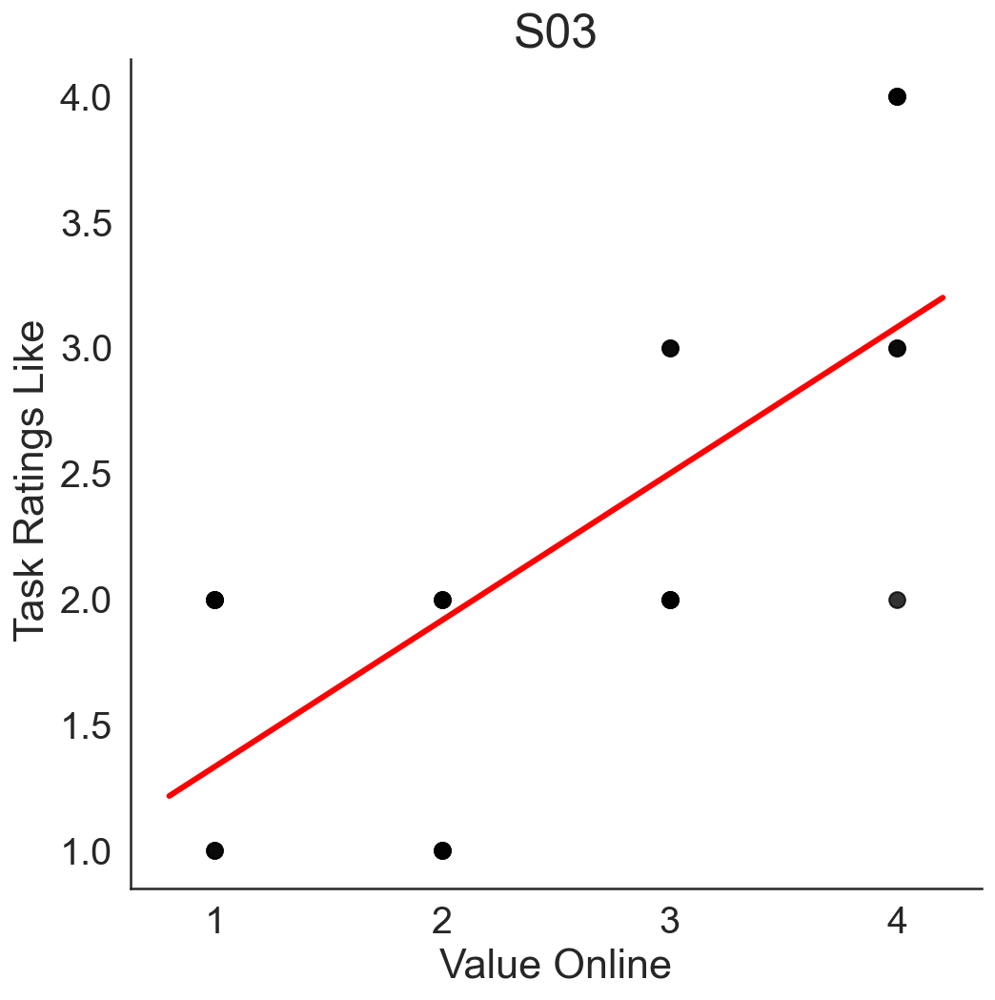

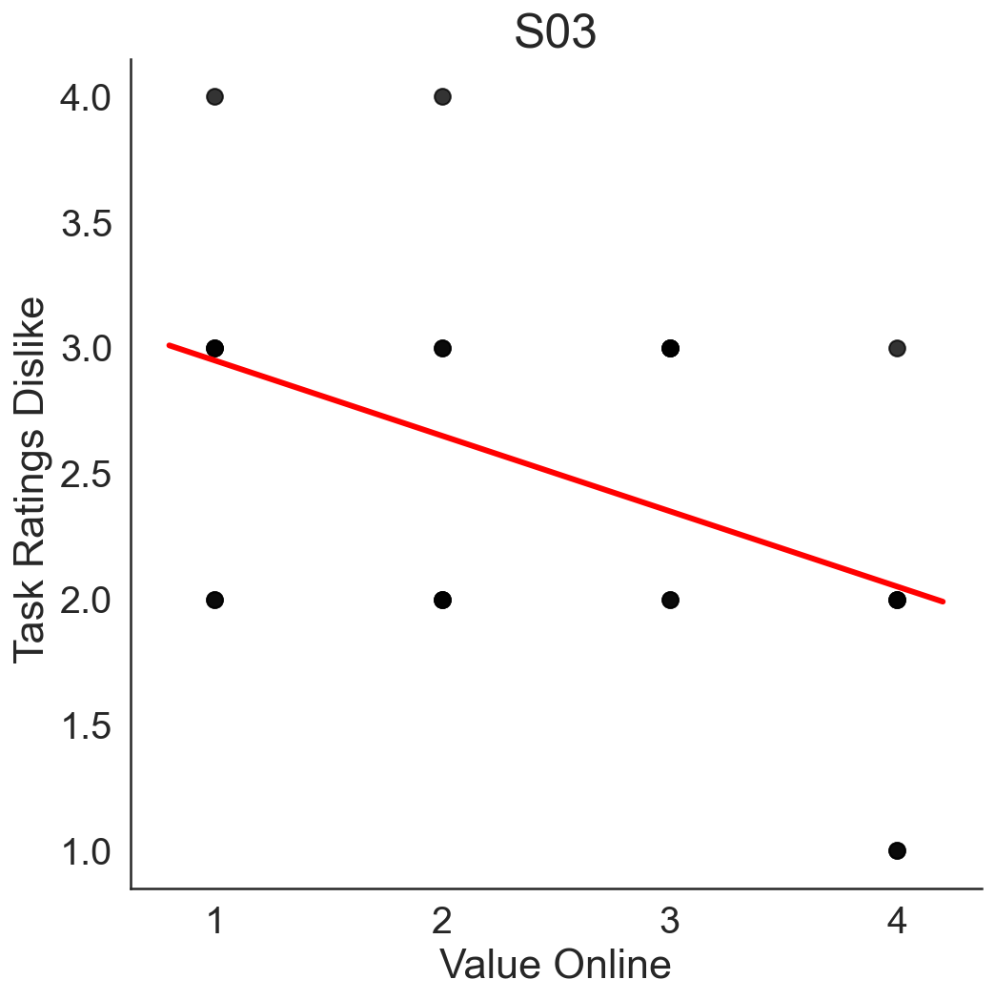

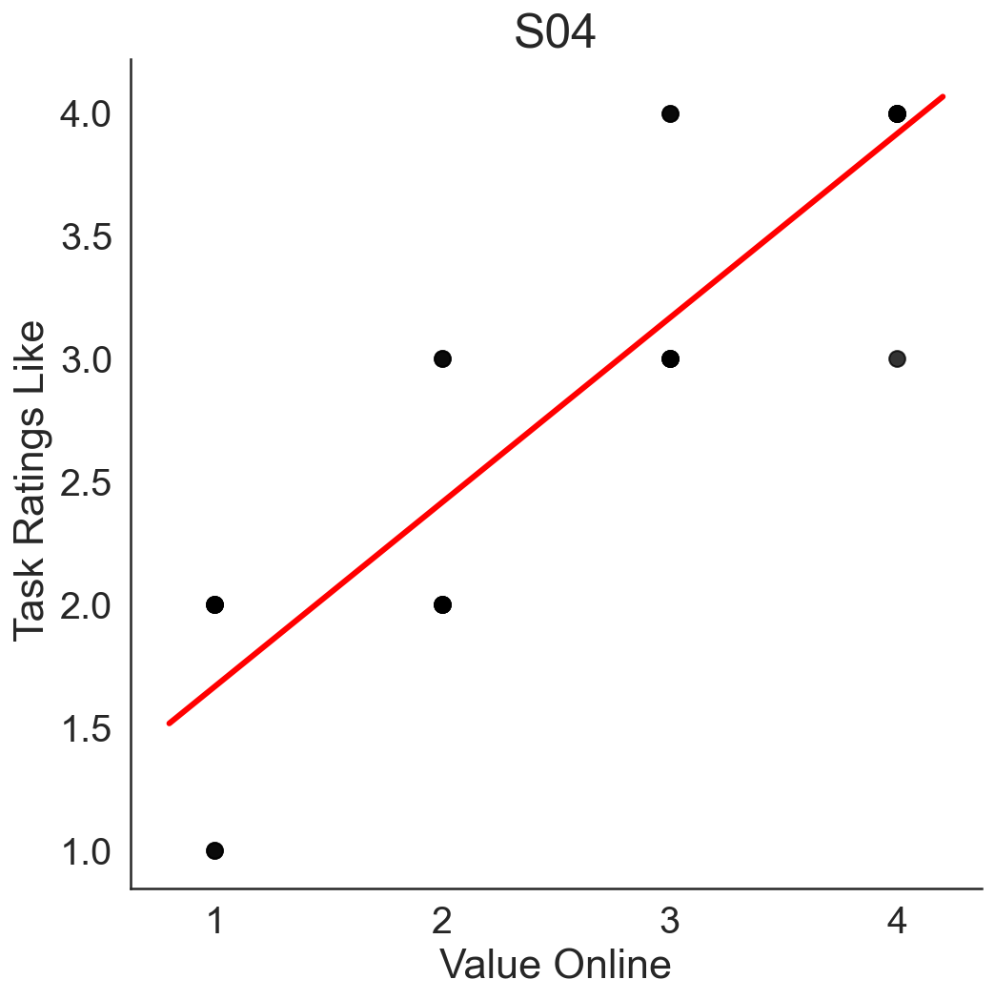

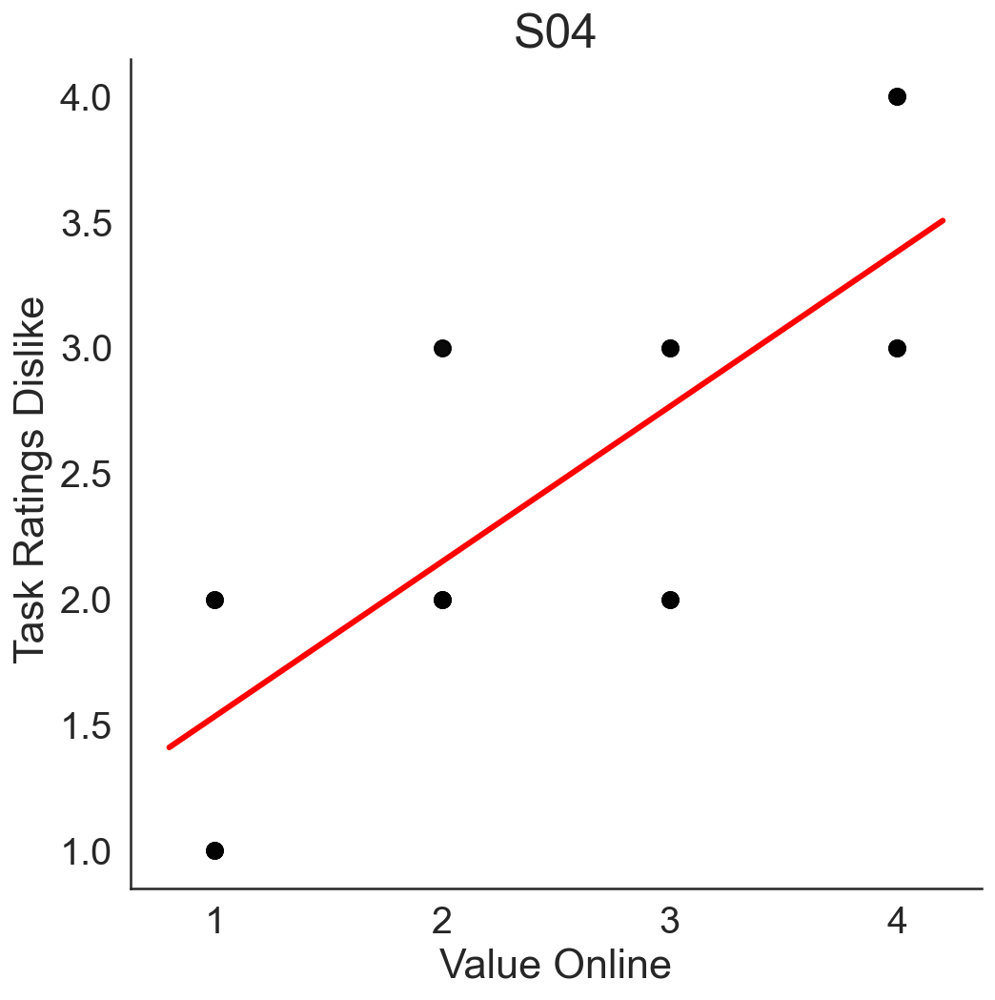

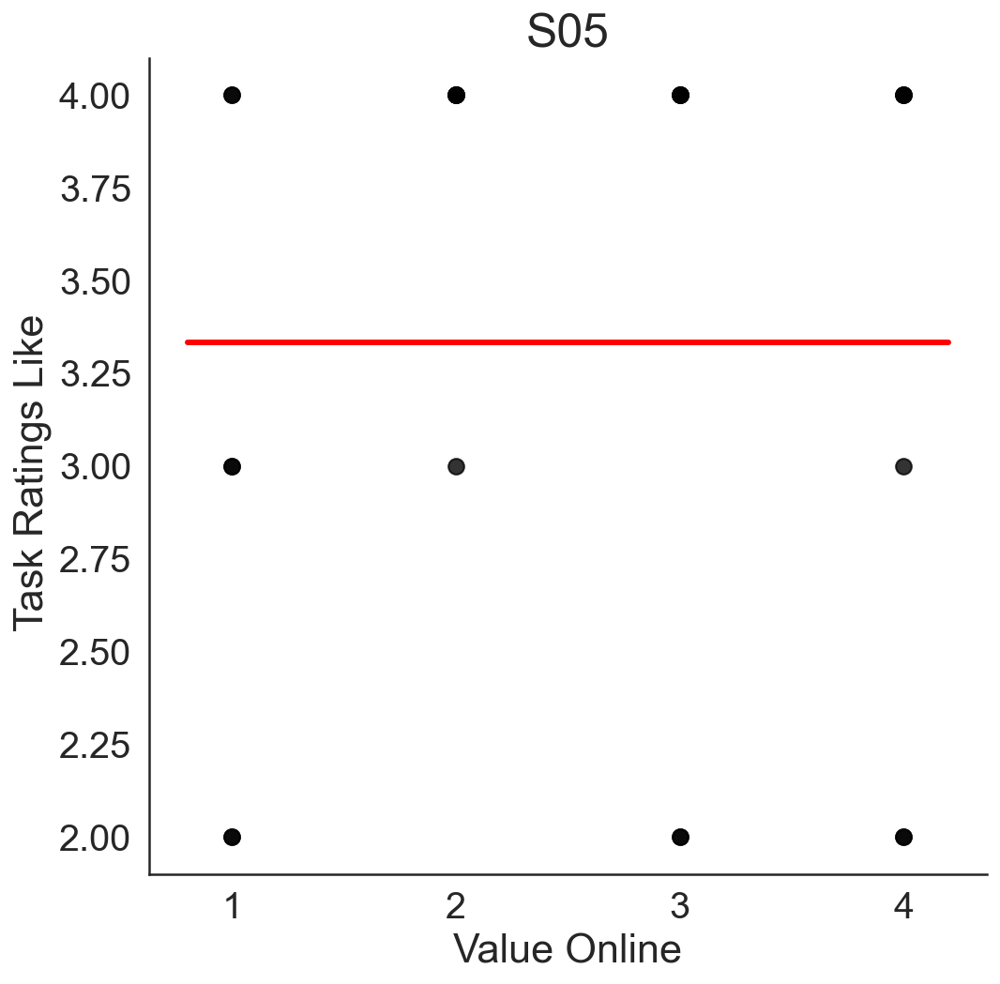

...

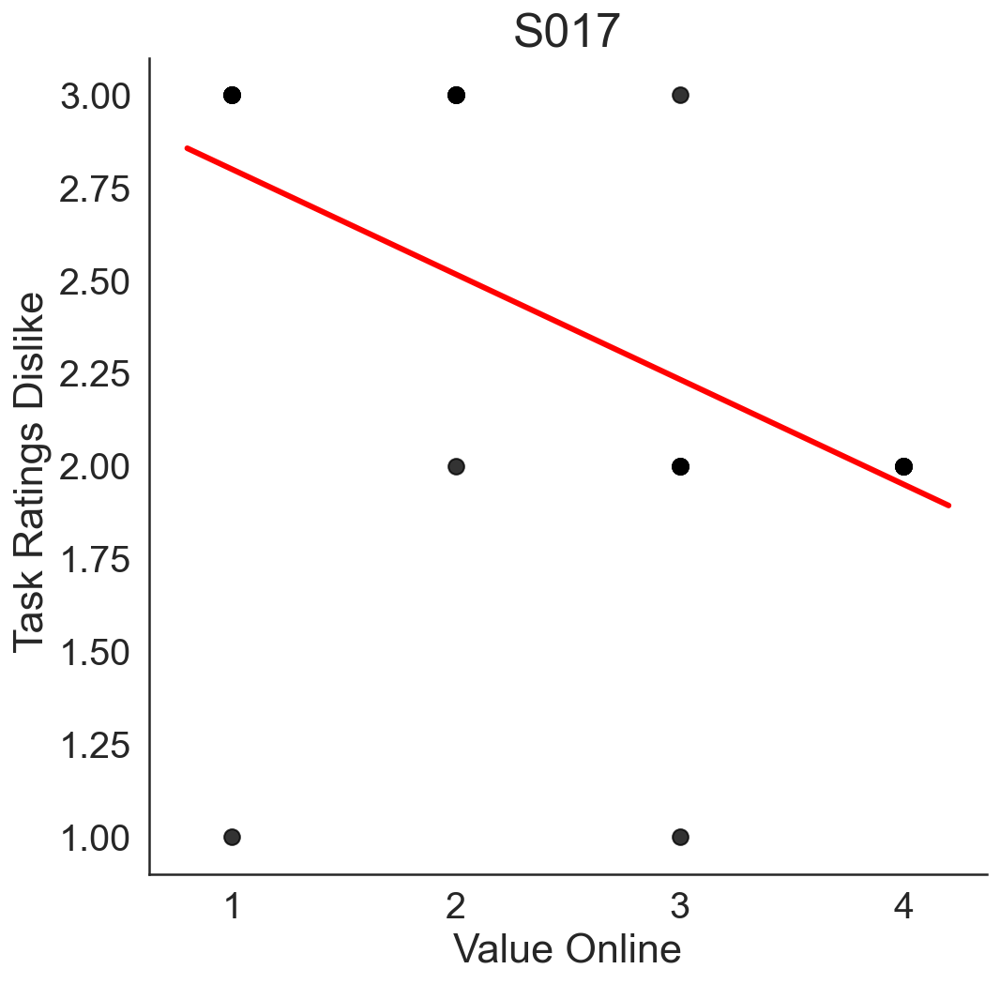

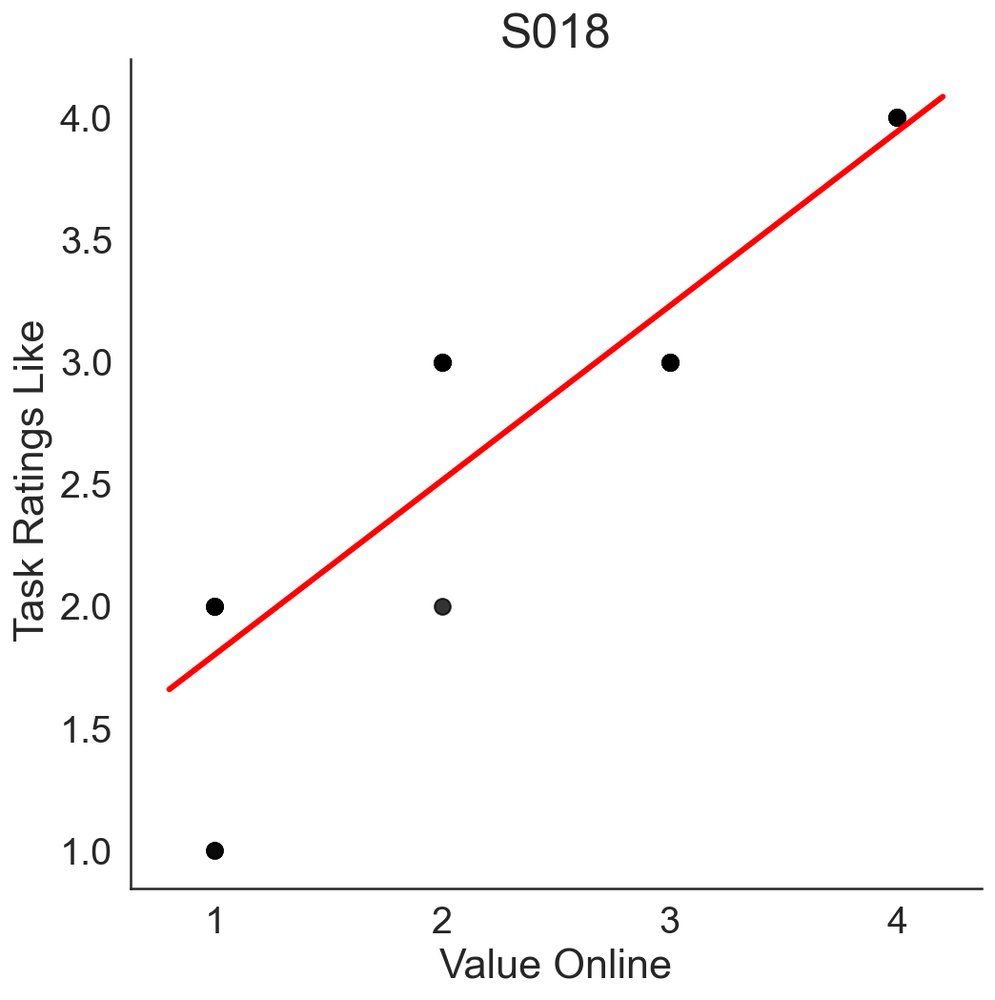

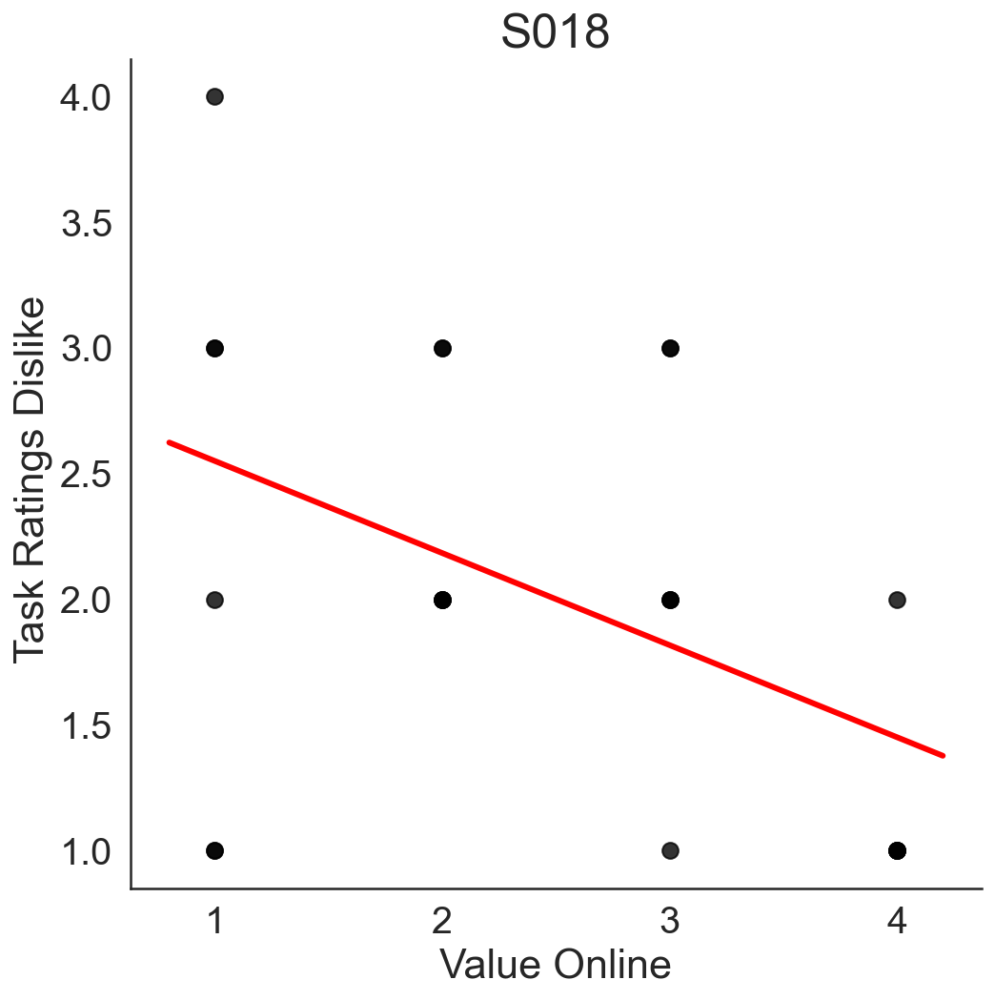

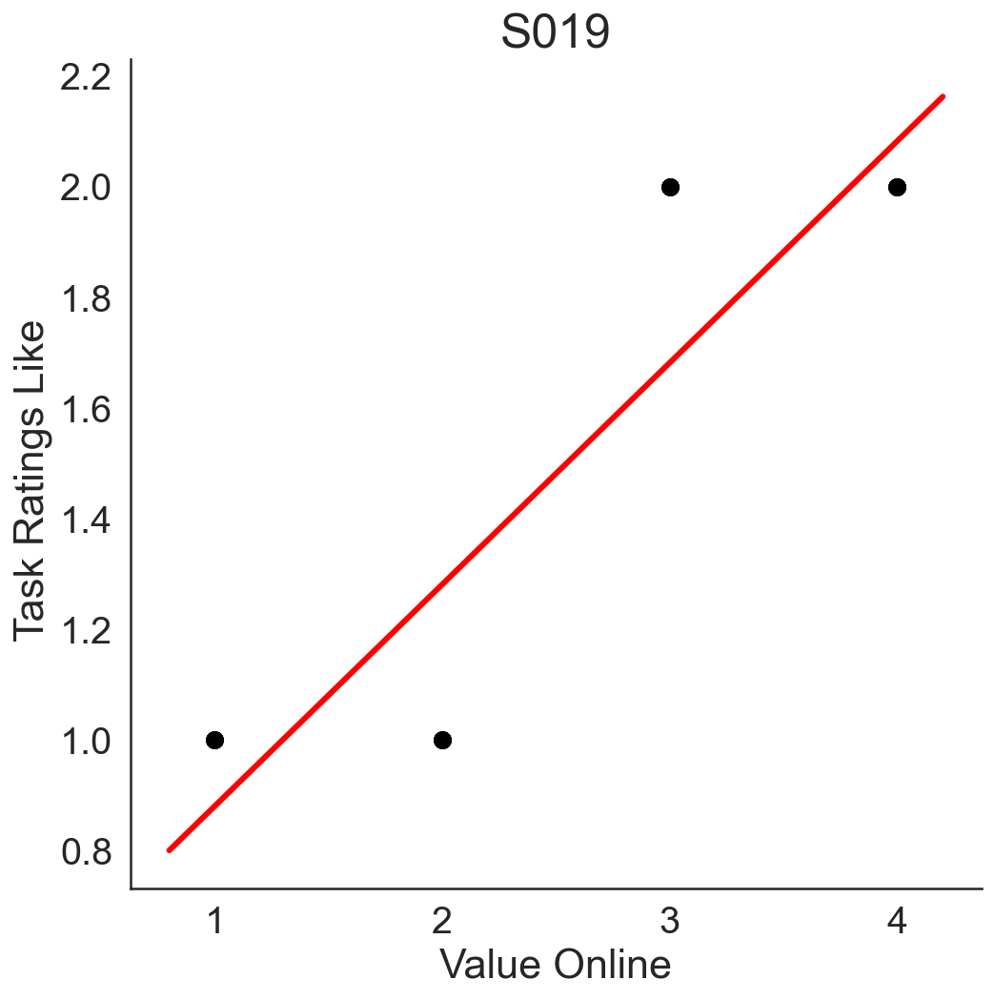

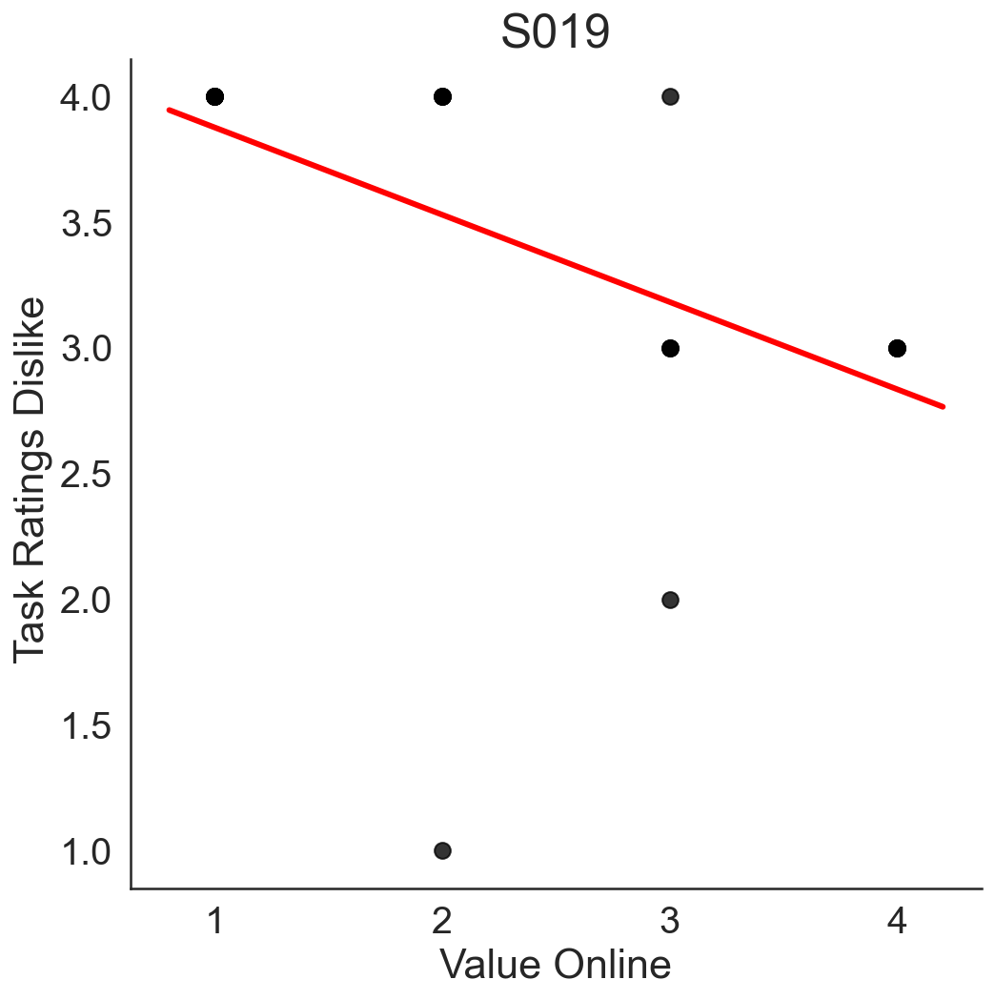

In [ ]:
#corrPlotSimple(data_exp_ratings_2, 'rat1','Ratings Frame 1','rat2','Ratings Frame 2')
for part in data_exp1["Part"].unique(): 

    corrPlotSimple(data_exp_onlyRatL.loc[(data_exp_onlyRatL['Part'] == part)], 'ValOnl','Value Online','rating','Task Ratings Like ', title = 'S0'+str(part))
    corrPlotSimple(data_exp_onlyRatD.loc[(data_exp_onlyRatD['Part'] == part)], 'ValOnl','Value Online','rating','Task Ratings Dislike ', title = 'S0'+str(part))


#  Choice data analysis
-----------------------------------------------------------------------

## 1. data visualization

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

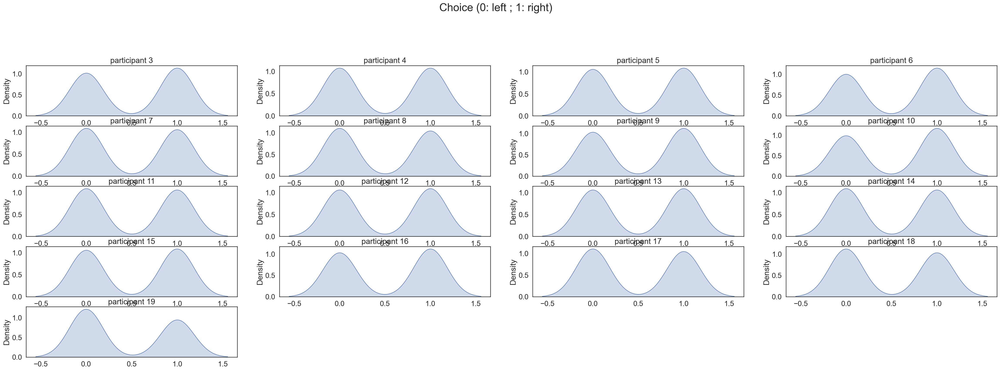

In [66]:
participant_densities(data_exp1,'choices', title = 'Choice (0: left ; 1: right)')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

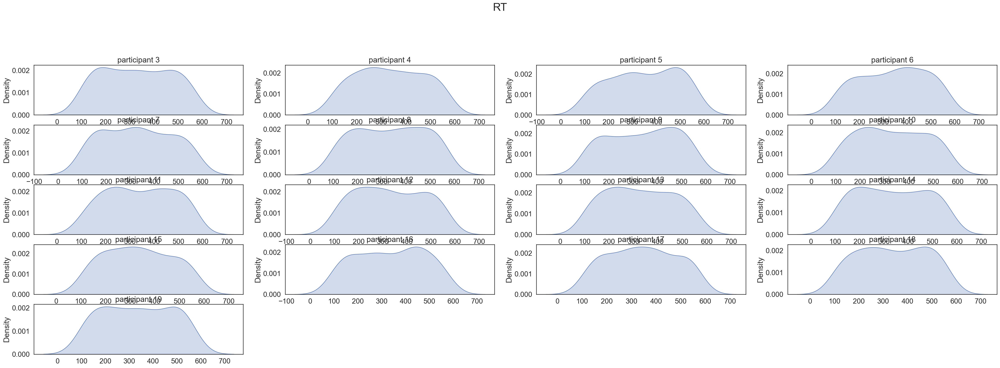

In [67]:
participant_densities(data_exp1,'RT',title = 'RT')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.
  from ipykernel import kernelapp as app
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: Passing non-integers as three-element po

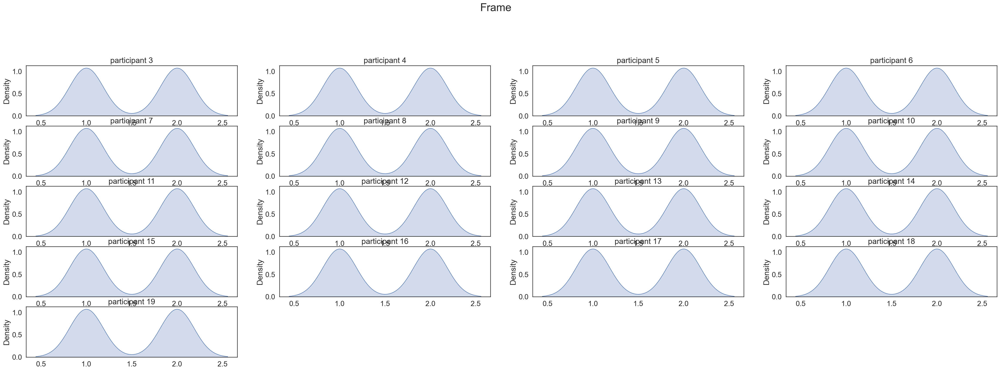

In [68]:
participant_densities(data_exp1,'frame',title = 'Frame')

#### This plot is just to check if I am presenting a comparable number of trials for each frames (in some cases is different because participants can miss the response)

## 2. accuracy per participant - Based on online rankngs of Pets

In [88]:
accuracies = pd.DataFrame( columns = [])

In [89]:
accuracy_like = []
accuracy_dislike = []

for i in data_exp1.Part.unique():
    print(i)
    accuracy_like.append(data_exp1.loc[(data_exp1['frame'] == 1) & (data_exp1['Part'] == i)].correctOn.mean())
    #print(accuracy_like)

    accuracy_dislike.append(data_exp1.loc[(data_exp1['frame'] == 2) & (data_exp1['Part'] == i)].correctOn.mean())
    #print(accuracy_dislike)

accuracies['participant'] = range(len(data_exp1.Part.unique()))
accuracies['like'] = accuracy_like
accuracies['dislike'] = accuracy_dislike


3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


In [90]:
accuracies

,participant,like,dislike
0,0,0.777778,0.791667
1,1,1.000000,1.000000
2,2,0.638889,0.611111
3,3,0.986111,0.944444
4,4,0.902778,0.777778
5,5,0.972222,1.000000
6,6,0.847222,0.916667
7,7,0.875000,0.847222
8,8,0.972222,0.986111
9,9,0.986111,1.000000


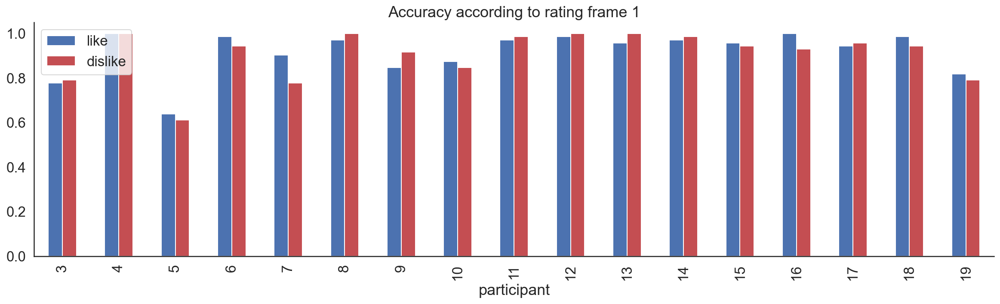

In [91]:
accuracies.plot.bar(x='participant',y=['like','dislike'], figsize=(20,5),title = 'Accuracy according to rating frame 1',color = ['b','r'])
ax.set_ylim(0, 1)
plt.xticks(range(0,len(data_exp1["Part"].unique())), data_exp1["Part"].unique())

sns.despine()


## Split dataframe for like and dislike

In [73]:
data_expL = data_exp1.loc[(data_exp1['frame'] == 1)] # 1 = Like, 2 = Dislike
data_expD = data_exp1.loc[(data_exp1['frame'] == 2)] # 1 = Like, 2 = Dislike

In [74]:
#data_expL = data_exp1.loc[(data_exp1['frame'] == 1) & (data_exp1['Part'] == 4)] # 1 = Like, 2 = Dislike
#data_expD = data_exp1.loc[(data_exp1['frame'] == 2) & (data_exp1['Part'] == 4)] # 1 = Like, 2 = Dislike

## 3. relationship between RT and |DV| (using ratings given in LIKE frame)

## 4. logistic plots for choice in like and dislike frames

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.

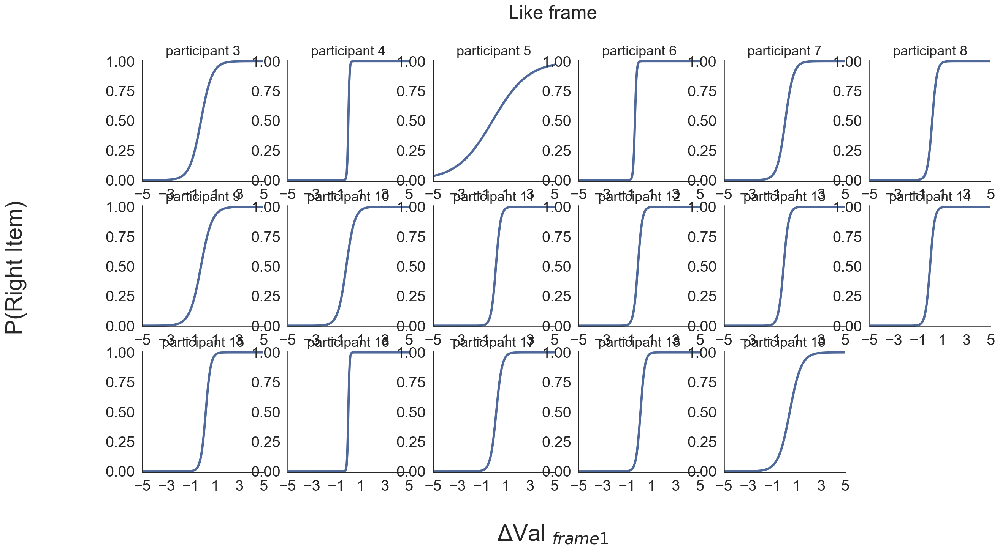

In [75]:
logisticplot_all_part( data=data_expL, xaxis='zDValOn', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame1}$',
                 modlowcol='#4F6A9A', title='Like frame', parvar='Part')

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:41: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.

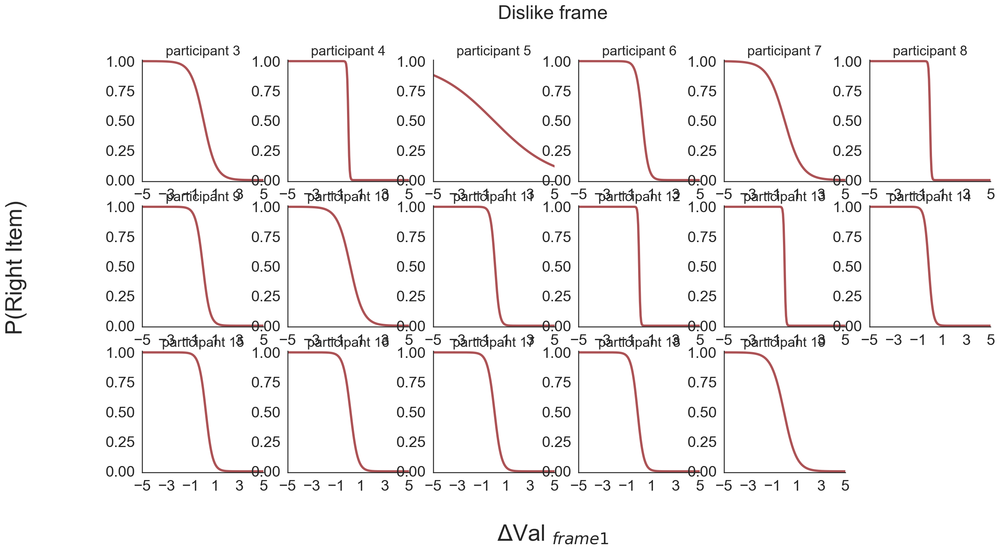

In [76]:
logisticplot_all_part( data=data_expD, xaxis='zDValOn', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame1}$',
                 modlowcol='#AC5255', title='Dislike frame', parvar='Part')

## 5. considering logistics plots aggregating all participants

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


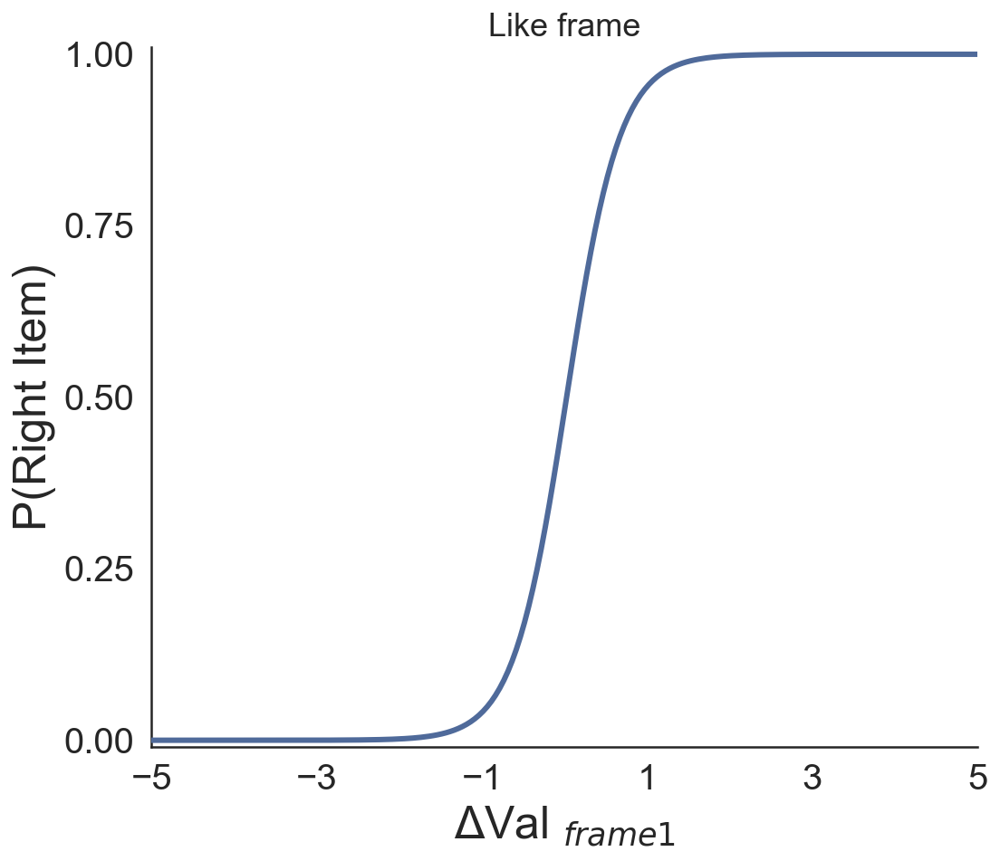

In [77]:
logisticplot_all( data=data_expL, xaxis='zDValOn', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame1}$',
                 modlowcol='#4F6A9A', title='Like frame', parvar='Part')
plt.tight_layout()

/Users/pradyumna/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.


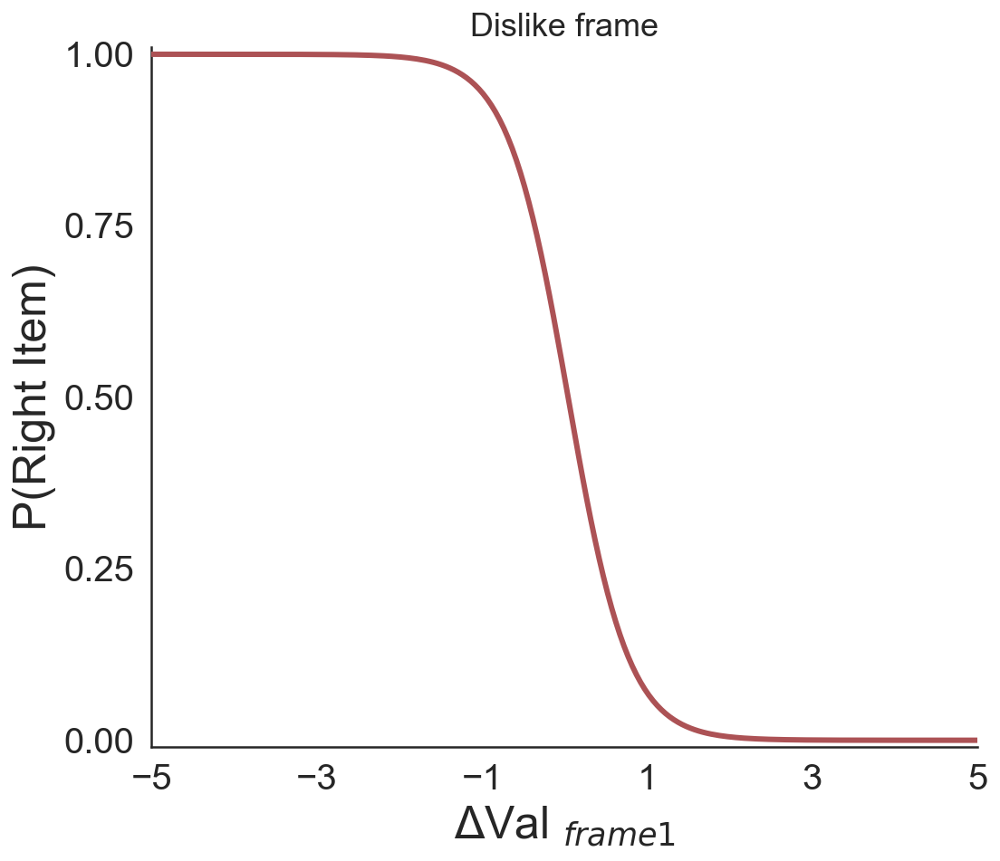

In [78]:
logisticplot_all( data=data_expD, xaxis='zDValOn', yaxis='choices', ylab='P(Right Item)', xlab= r'ΔVal $_{frame1}$',
                 modlowcol='#AC5255', title='Dislike frame', parvar='Part')
plt.tight_layout()

## 6. (preliminar) regression analysis on Choice
### zDVal1: difference in value (mean ratings for pet right -left) in like frame (frame 1)
### zDVal2: difference in value (mean ratings for pet right -left) in dislike frame (frame 2)
### zDVarX: difference in rating variability (mean variability pet right -left)  in frame X


In [79]:
%R -i data_exp1
data_exp1

,level_0,index,trial,trialOnset,leftId,rightId,frame,trialOnsetTim,trialSnd1Tim,trialSnd2Tim,...,zDChoUnchosenOn,TotValOn,DValOn,absDValOn,zDValOn,zTotValOn,zAbsDValOn,zRT,correctOn,choices
0,0,0,0.0,97.154134,6.0,2.0,2.0,97.162739,98.174875,98.675894,...,1.098170,4,2,2,1.095445,-0.774597,0.447214,-1.602820,0,1
1,1,1,1.0,107.304030,5.0,6.0,1.0,107.314542,108.334392,108.835600,...,-0.543264,3,-1,1,-0.547723,-1.549193,-0.894427,-1.546306,0,1
2,2,2,2.0,118.904234,6.0,2.0,1.0,118.911135,119.928075,120.429292,...,1.098170,4,2,2,1.095445,-0.774597,0.447214,-1.454780,1,1
3,3,3,3.0,131.955079,5.0,6.0,2.0,131.961902,132.989758,133.490987,...,0.551025,3,-1,1,-0.547723,-1.549193,-0.894427,-1.374383,0,0
4,4,4,4.0,162.405880,5.0,2.0,1.0,162.413470,163.444844,163.946065,...,0.551025,5,1,1,0.547723,0.000000,-0.894427,-1.158225,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2443,2443,2443,19.0,494.465870,6.0,5.0,1.0,494.473105,495.497880,495.998354,...,1.087711,6,-2,2,-1.095445,0.774597,0.447214,1.142227,1,0
2444,2444,2444,20.0,504.616747,6.0,2.0,2.0,504.623988,505.642842,506.143454,...,-1.611861,5,-3,3,-1.643168,0.000000,1.788854,1.211579,1,1
2445,2445,2445,21.0,517.666808,2.0,1.0,1.0,517.674386,518.700931,519.201360,...,1.087711,4,2,2,1.095445,-0.774597,0.447214,1.307369,1,1
2446,2446,2446,22.0,536.518043,6.0,1.0,1.0,536.526908,537.553326,538.054032,...,0.547796,7,-1,1,-0.547723,1.549193,-0.894427,1.438222,1,0


In [80]:
%%R
# Separating the data for both conditions 
data_exp1_Like <- data_exp1[ which(data_exp1$frame=='1'), ]
data_exp1_DisLike <- data_exp1[ which(data_exp1$frame=='2'), ]

[1] "Like BIC:"
[1] 676.7264
[1] "DisLike BIC:"
[1] 783.367


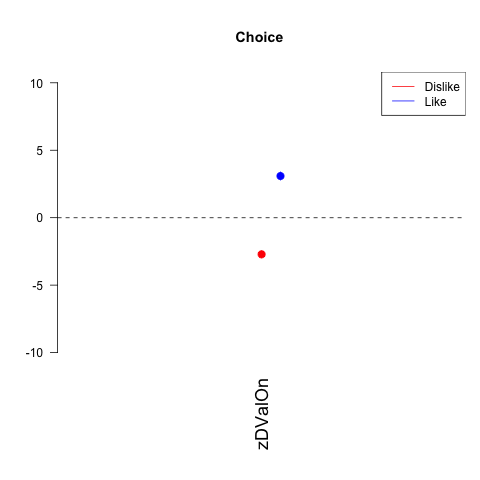

In [81]:
%%R
title_plot = "Choice "

ModelChoiceL_1 <- glm(choices ~ zDValOn , data=data_exp1_Like, family=binomial(link="logit"))
ModelChoiceD_1 <- glm(choices ~ zDValOn , data=data_exp1_DisLike, family=binomial(link="logit"))

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-10, 10) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

## Since I don't have confidence I try to predict RT

[1] "Like BIC:"
[1] 3485.295
[1] "DisLike BIC:"
[1] 3460.694


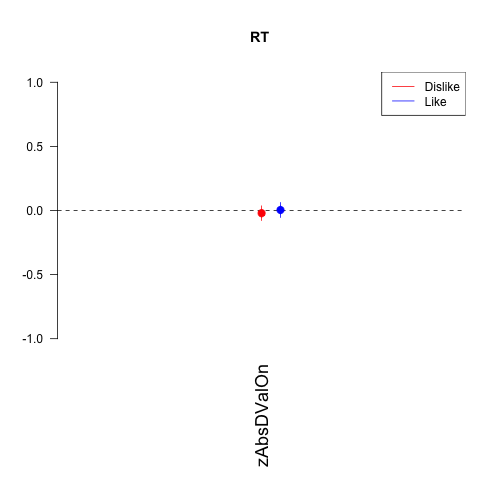

In [82]:
%%R
title_plot = "RT "

ModelChoiceL_1 <- glm(zRT ~ zAbsDValOn   , data=data_exp1_Like, )
ModelChoiceD_1 <- glm(zRT ~ zAbsDValOn   , data=data_exp1_DisLike, )

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1, 1) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

[1] "Like BIC:"
[1] 3282.122
[1] "DisLike BIC:"
[1] 3267.307


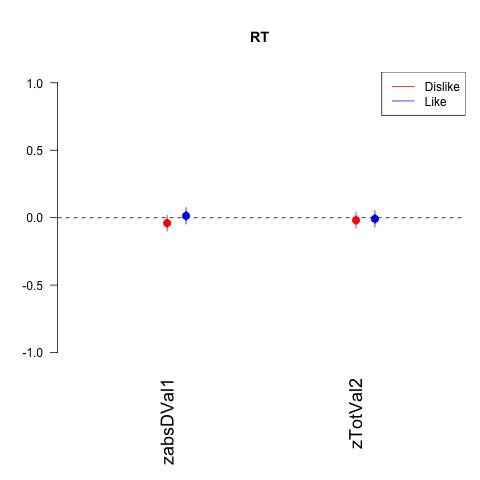

In [94]:
%%R
title_plot = "RT "

ModelChoiceL_1 <- glm(zRT ~ zabsDVal1 + zTotVal2  , data=data_exp1_Like, )
ModelChoiceD_1 <- glm(zRT ~ zabsDVal1 + zTotVal2  , data=data_exp1_DisLike, )

BIC1 = BIC(ModelChoiceL_1)
BIC2 = BIC(ModelChoiceD_1)
print("Like BIC:")
print(BIC1)
print("DisLike BIC:")
print(BIC2)

coefplot(ModelChoiceD_1,intercept=FALSE,vertical = FALSE,  col.pts="red", cex.var=1.5, cex.pts=2, mar = c(8,4,5,1) ,ylim=c(-1, 1) ,main=title_plot)
coefplot(ModelChoiceL_1, intercept=FALSE, vertical = FALSE, add=TRUE, col.pts="blue", cex.var=1.5, cex.pts=2,mar = c(8,4,5,1))
legend("topright",  legend=c("Dislike", "Like"),col=c("red", "blue"), lty=1:1, cex=1)

-----------------------------------------------------

# Import toolboxes and functions

In [5]:
import numpy as np
import pandas as pd
from pandas.core.frame import DataFrame as DF

import seaborn as sns
sns.set(color_codes=True)
#np.random.seed(sum(map(ord, "distributions")))
from sklearn import linear_model  # packages for the logistic regression function to plot the logistic regression 
from sklearn.linear_model import LogisticRegression # packages for the logistic regression function to plot the logistic regression 
import scipy
from scipy import stats, integrate
from scipy.stats import mode
from scipy.stats.stats import pearsonr # Pearson's correlation
from copy import copy as copy
import operator as operator
import pylab

# Plotting tools
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
%pylab inline
figsize(5, 5)

import glob

import os
# Added to avoid OMP:error#15
os.environ['KMP_DUPLICATE_LIB_OK']='True'

Populating the interactive namespace from numpy and matplotlib


/Users/pradyumna/anaconda3/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['copy', 'pylab']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [6]:
def logisticplot_all (data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
    sns.set(font_scale=1.5, style='white')
    fig = figure(figsize=(8,7))
    fig.set_facecolor('white')
    
    # defining the sigmoid function
    def model(x):
        y = 1 / (1 + np.exp(-x))
        return y
    
    sub = plt.subplot()

    #run the classifier
    clf = linear_model.LogisticRegression(C=1e5)

    logit_all = {}

    # I think this defines the problem space
    X_test = np.linspace(-5,10,300)

   #fitting the predictive logistic model for all the trials, for a participant specified by x
            # first I specify the value difference right - left, then I specify the choices, left or right
    clf.fit(data[xaxis][:, np.newaxis],
            data[yaxis])
    logit_all = model(X_test * clf.coef_ + clf.intercept_).ravel()

    #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)
    
    all_coef = clf.coef_
    all_intercept = clf.intercept_
    
    #Plotting the predictive lines
    line_all = sub.plot(X_test, logit_all, color=modlowcol, linewidth=3, zorder=5,linestyle='-')

   # #Plotting the binned data
   # data['DVBin2'] = data.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values
    
   # # determine the x coordinates
   # x_cords= data.groupby('DVBin2')[xaxis].mean()
    
   # # determine low y coordinates
   # y_cords_low = data.loc[(data[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values
    
   # # determine low y standard errors
   # test = pd.DataFrame(data.loc[(data[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
   # y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
    
   # # determine high y coordinates
   # y_cords_high = data.loc[(data[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values
    
   # # determine high y standard errors
   # test2 = pd.DataFrame(data.loc[data[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
   # y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))
    
   # # plot the low points
   # plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
   # # plot low error bars
   # plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)
    
   # # plot the high points
   # plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
   # # plot high error bars
   # plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)
    
    
    # Set Labels
    sub.set_ylabel(ylab, fontsize=25)
    sub.set_xlabel(xlab, fontsize=25)

    # Set Ticks
    sub.set_xticks((-5,-3,-1,1,3,5))
    sub.set_yticks((0,0.25,0.5,0.75,1))
    sub.tick_params(axis='both', which='major', labelsize=20)

    # Set Limits
    sub.set_ylim(-0.01, 1.01)
    sub.set_xlim(-5, 5)

    # Set Title
    if title == 'empty':
        sub.set_title('')
    else:
        sub.set_title(title)
    
    #sub.legend(loc=0, prop={'size':20})
    sns.despine()

In [7]:
def logisticplot_all_part (data, xaxis='zDV', yaxis='G_choice', ylab='P(Chose Reference Item)', xlab='DV (Z-score)',
                 modlowcol='#AAAAAA', title='empty', parvar='SubNo'):
    
 
    # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()
    fig = figure(figsize=(20,10))
    fig.set_facecolor('white')
    
    
    # Counter to know where to plot the particpant
    order = 1

    
    for x in participants:

            sub={}
            sub['%s' % x] = plt.subplot(int(len(participants)/6+1), 6, order)

            data_in = data.loc[data['Part'] == x]
            sns.set(font_scale=1.5, style='white')
            
            # defining the sigmoid function
            def model(x):
                y = 1 / (1 + np.exp(-x))
                return y

            sub['%s' % x].set_title('participant %s' % x)


            #run the classifier
            clf = linear_model.LogisticRegression(C=1e5)

            logit_all = {}

            # I think this defines the problem space
            X_test = np.linspace(-5,10,300)

           #fitting the predictive logistic model for all the trials, for a participant specified by x
                    # first I specify the value difference right - left, then I specify the choices, left or right
            clf.fit(data_in[xaxis][:, np.newaxis],
                    data_in[yaxis])
            logit_all = model(X_test * clf.coef_ + clf.intercept_).ravel()

            #print ('Part: ',x ,' High measure:logit coef =',clf.coef_, '; Intercept: ', clf.intercept_)

            all_coef = clf.coef_
            all_intercept = clf.intercept_

            #Plotting the predictive lines
            line_all = sub['%s' % x].plot(X_test, logit_all, color=modlowcol, linewidth=3, linestyle='-')
            #line_all = sub['%s' % x].plot(X_test, logit_all, color="#000000", linewidth=3, label=modlow, zorder=5,linestyle='--')

           # #Plotting the binned data
           # data['DVBin2'] = data.groupby(parvar).apply(parsplit, input=xaxis, quantiles=4).values

           # # determine the x coordinates
           # x_cords= data.groupby('DVBin2')[xaxis].mean()

           # # determine low y coordinates
           # y_cords_low = data.loc[(data[moderator]==0), :].groupby('DVBin2')[yaxis].mean().values

           # # determine low y standard errors
           # test = pd.DataFrame(data.loc[(data[moderator]==0), :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
           # y_low_error = test.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))

    
           # # determine high y coordinates
           # y_cords_high = data.loc[(data[moderator]==1), :].groupby('DVBin2')[yaxis].mean().values

           # # determine high y standard errors
           # test2 = pd.DataFrame(data.loc[data[moderator]==1, :].groupby(['DVBin2', parvar])[yaxis].mean()).reset_index()
           # y_high_error = test2.groupby('DVBin2')[yaxis].std()/np.sqrt(len(test[parvar].unique()))

           # # plot the low points
           # plt.scatter(x_cords, y_cords_low, c=modlowcol, marker='D', s=60, zorder=1)
           # # plot low error bars
           # plt.errorbar(x_cords, y_cords_low, yerr=y_low_error, fmt='o', zorder=3, c=modlowcol)

           # # plot the high points
           # plt.scatter(x_cords, y_cords_high, c=modhighcol, marker='o', s=60, zorder=2)
           # # plot high error bars
           # plt.errorbar(x_cords, y_cords_high, yerr=y_high_error, fmt='o', zorder=4, c=modhighcol)

    
            # Set Labels
            #sub['%s' % x].set_ylabel(ylab, fontsize=30)
           # sub['%s' % x].set_xlabel(xlab, fontsize=30)

            # Set Ticks
            sub['%s' % x].set_xticks((-5,-3,-1,1,3,5))
            sub['%s' % x].set_yticks((0,0.25,0.5,0.75,1))
            sub['%s' % x].tick_params(axis='both', which='major', labelsize=20)

            # Set Limits
            sub['%s' % x].set_ylim(-0.01, 1.01)
            sub['%s' % x].set_xlim(-5, 5)
            order += 1


    fig.text(0.5, 0.0, xlab, fontsize= 30, ha='center')
    fig.text(0.0, 0.5, ylab,fontsize= 30, va='center', rotation='vertical')
    
    #sub.legend(loc=0, prop={'size':20})
    fig.suptitle(title, fontsize = 25)

    
    sns.despine()

In [8]:
def z_score1(data_all, part_def,z_score_var):
    z_matrix=[]
    z_matrix_aux=[]

    for i in (data_all[part_def].unique()):
        Choicedata = data_all.loc[data_all[part_def] == i]    
    
        pX_A= pd.to_numeric(Choicedata[z_score_var]) 
        pX_zA= (pX_A - np.mean(pX_A))/np.std(pX_A)

        z_matrix_aux= pX_zA.values
    
        for  j in range(len(z_matrix_aux)):    
            z_matrix.append(z_matrix_aux[j])
    return z_matrix

In [9]:
def participant_densities(data, var, xlim=(0,100), rug=True, title = ''):
    # a counter that tells us where a given participant's data should be plotted
    order = 1

    # a list of all the participants in the dataset
    participants = data.loc[:, 'Part'].unique()

    # defining the figure size
    sns.set_style('white')
    fig = figure(figsize=(40,20))

    for x in participants:
        # defining the sub figures
            sub={}
            sub['%s' % x] = plt.subplot(len(participants)/2, 4, order)
            sns.kdeplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x], shade=True)
            #if rug==True:
            #    sns.rugplot(data.loc[data['Part'] == x, var].values, ax = sub['%s' % x])
            sub['%s' % x].set_title('participant %s' % x)
            #sub['%s' % x].set_xlim(xlim)
            order += 1
    fig.suptitle(title, fontsize = 25)


In [10]:
def corrPlotSimple(data_exp1, x_variable,x_varlabel,y_variable,y_varlabel, title=''):
    
    data_exp1_drop = data_exp1.dropna(subset=[x_variable,y_variable])

    results = pearsonr(data_exp1_drop[x_variable], data_exp1_drop[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))
    
    f = plt.figure(figsize=(8, 8))
    sns.set(style='white', font_scale=1.8)
    ax = sns.regplot(data=data_exp1_drop, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
    x=data_exp1_drop[x_variable]
    y=data_exp1_drop[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    ax.plot(future, future_fit, color='Red', lw=3)
    ax.set_title(title, fontsize = 25)

    sns.despine()
    


In [11]:
def corrPlotPart(data_exp1, x_variable,x_varlabel,y_variable,y_varlabel, title=''):
    
    data_exp1_drop = data_exp1.dropna(subset=[x_variable,y_variable])

    results = pearsonr(data_exp1_drop[x_variable], data_exp1_drop[y_variable])
    print ("Pearson's r = {0}".format(np.round(results[0], 3)), "p = ", np.round(results[1], 3))
    
    #f = plt.figure(figsize=(8, 8))
    sns.set(style='white', font_scale=1.8)
    ax = sns.regplot(data=data_exp1_drop, x= x_variable, y=y_variable, fit_reg=False, ci=0, color='#000000', scatter_kws={'s':70})
    ax.set(ylabel=y_varlabel, xlabel=x_varlabel)
    x=data_exp1_drop[x_variable]
    y=data_exp1_drop[y_variable]
    fit = np.polyfit(x, y, deg=1)
    future = np.arange(min(x)-0.2, max(x)+0.2, 0.01)
    fit_fn = np.poly1d(fit)
    future_fit = np.polyval(fit_fn, future)
    ax.plot(future, future_fit, color='Red', lw=3)
    ax.set_title(title, fontsize = 25)

    sns.despine()
    


In [12]:
import rpy2

%load_ext rpy2.ipython
# Set up interface with R
# Make it easy to set and find values in a multi-index DF
idx = pd.IndexSlice
# Set up interface with R
%config InlineBackend.figure_format = 'retina'
import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings("ignore", category=RRuntimeWarning)


In [13]:
%%R
library(lme4)
#library(car)
library(optimx)
#library(ggplot2)
library(MASS)
#library(broom)
library(dplyr)
library(reshape2)
library(arm)
library(multcomp)
library(pbkrtest)

R[write to console]: Loading required package: Matrix

R[write to console]: 
Attaching package: ‘dplyr’


R[write to console]: The following object is masked from ‘package:MASS’:

    select


R[write to console]: The following objects are masked from ‘package:stats’:

    filter, lag


R[write to console]: The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


R[write to console]: 
arm (Version 1.10-1, built: 2018-4-12)


R[write to console]: Working directory is /Users/pradyumna/Documents/GiTs/PFT_fMRI_2019/Pilots Pet Scanner/Analysis


R[write to console]: Loading required package: mvtnorm

R[write to console]: Loading required package: survival

R[write to console]: Loading required package: TH.data

R[write to console]: 
Attaching package: ‘TH.data’


R[write to console]: The following object is masked from ‘package:MASS’:

    geyser


